In [1]:
import glob
import numpy as np
import xarray as xr
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, detrend, lfilter, sosfilt, welch
import pickle
import os

In [2]:
markers = ["o", "s", "^", "D", "v", ">", "<", "P", "X", "*", "p", "h", "H", "8"]

base_models = [
    "AWI-CM-1-1-MR",
    "BCC-CSM2-MR",
    "CESM2-WACCM",
    "CNRM-CM6-1",
    "CNRM-ESM2-1",
    "E3SM-1-0",
    "EC-Earth3",
    "IPSL-CM6A-LR",
    "MIROC6",
    "MPI-ESM1-2-HR",
    "MRI-ESM2-0",
]

new_models = ["GFDL-ESM4", "HadGEM3-GC31-LL", "UKESM1-0-LL"]

style_order = base_models + [m for m in new_models if m not in base_models]
colors = plt.cm.tab20(np.linspace(0, 1, len(style_order)))

style_map = {}
for i, m in enumerate(style_order):
    style_map[m] = {
        "marker": markers[i % len(markers)],
        "color":  colors[i]
    }


In [3]:
import pickle

with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/qbo_bp_results.pkl", "rb") as f:
    qbo_bp_results = pickle.load(f)

In [4]:
nyears = {}

for name, da in qbo_bp_results.items():
    nt = da.sizes["time"]          # number of months
    nyears[name] = nt / 12

print(nyears)

{'AWI-CM-1-1-MR': 500.0, 'BCC-CSM2-MR': 600.0, 'CESM2-WACCM': 499.0, 'CNRM-CM6-1': 500.0, 'CNRM-ESM2-1': 500.0, 'E3SM-1-0': 375.0, 'EC-Earth3': 501.0, 'GFDL-ESM4': 500.0, 'HadGEM3-GC31-LL': 400.0, 'IPSL-CM6A-LR': 1200.0, 'MIROC6': 800.0, 'MPI-ESM1-2-HR': 500.0, 'MRI-ESM2-0': 701.0, 'UKESM1-0-LL': 750.0}


# Figure 1: QBO Seasonality?

In [5]:
with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/winds_obs.pkl", "rb") as f:
    winds_obs = pickle.load(f)

### Observations Peaks

In [6]:
wind_test_era5 = winds_obs["ERA5"]
wind_test_merra2 = winds_obs["MERRA2"]
wind_test_jra55 = winds_obs["JRA55"]

In [7]:
# QBOE peaks = local maxima of wind_comp_test
east_peaks_era5, _ = find_peaks(-wind_test_era5) #easterly
# QBOW peaks = local minima 
west_peaks_era5, _ = find_peaks(wind_test_era5) #westerly

east_peaks_jra55, _ = find_peaks(-wind_test_jra55)
west_peaks_jra55, _ = find_peaks(wind_test_jra55)

east_peaks_merra2, _ = find_peaks(-wind_test_merra2)
west_peaks_merra2, _ = find_peaks(wind_test_merra2)

# convert peak indices to month numbers (1–12)
east_months_era5 = (east_peaks_era5 % 12) + 1
west_months_era5 = (west_peaks_era5 % 12) + 1

east_months_jra55 = (east_peaks_jra55 % 12) + 1
west_months_jra55 = (west_peaks_jra55 % 12) + 1

east_months_merra2 = (east_peaks_merra2 % 12) + 1
west_months_merra2 = (west_peaks_merra2 % 12) + 1

# 4. Count occurrences per month
months = np.arange(1, 13)
east_counts_era5 = np.bincount(east_months_era5 - 1, minlength=12)
west_counts_era5 = np.bincount(west_months_era5 - 1, minlength=12)

east_counts_jra55 = np.bincount(east_months_jra55 - 1, minlength=12)
west_counts_jra55 = np.bincount(west_months_jra55 - 1, minlength=12)

east_counts_merra2 = np.bincount(east_months_merra2 - 1, minlength=12)
west_counts_merra2 = np.bincount(west_months_merra2 - 1, minlength=12)

In [8]:
nyears_era5 = len(wind_test_era5)/12
print("era5:", nyears_era5)
nyears_jra55 = len(wind_test_jra55)/12
print("jra55:", nyears_jra55)
nyears_merra2 = len(wind_test_merra2)/12
print("merra2:", nyears_merra2)

era5: 44.0
jra55: 44.0
merra2: 43.0


In [9]:
east_prob_era5 = east_counts_era5 / east_counts_era5.sum()
west_prob_era5 = west_counts_era5 / west_counts_era5.sum()

east_prob_merra2 = east_counts_merra2 / east_counts_merra2.sum()
west_prob_merra2 = west_counts_merra2 / west_counts_merra2.sum()

east_prob_jra55 = east_counts_jra55 / east_counts_jra55.sum()
west_prob_jra55 = west_counts_jra55 / west_counts_jra55.sum()

### CMIP6 Peaks

In [10]:
with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/qbo_seasonal_peaks_CMIP.pkl", "rb") as f:
    results = pickle.load(f)

# with open("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/sensitivity_results.pkl", "rb") as f:
#     sensitivity_results = pickle.load(f)

# results = sensitivity_results["1sigma_15mo"]

with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/seasonal_fit_prob.pkl", "rb") as f:
    fit_results_prob = pickle.load(f)

In [11]:
print(results)

{'AWI-CM-1-1-MR': (array([10, 10, 13, 11,  6, 15, 12, 13, 23, 15, 11, 10]), array([11,  8,  6,  8, 16, 10, 14, 18, 15, 15, 11, 11])), 'BCC-CSM2-MR': (array([13, 25, 22, 23, 29, 29, 26,  8, 13,  5,  6, 11]), array([18, 20, 18, 29, 41, 29, 15, 10,  7,  6,  8, 11])), 'CESM2-WACCM': (array([11, 10, 10, 20,  7, 17, 23, 36, 35, 27, 21, 11]), array([ 8,  8,  7,  6, 14, 15, 28, 29, 31, 28, 15,  3])), 'CNRM-CM6-1': (array([21, 24, 28, 18, 26, 26, 25, 34, 21, 17, 23, 17]), array([21, 20, 20, 26, 30, 30, 24, 24, 18, 14, 25, 27])), 'CNRM-ESM2-1': (array([25, 32, 31, 20, 12, 23, 22, 35, 37, 23, 24, 18]), array([23, 11, 22, 17, 34, 25, 23, 25, 21, 27, 37, 32])), 'E3SM-1-0': (array([18,  7,  4, 13, 24, 29, 14, 19, 13, 18, 22, 28]), array([18, 22, 23, 25, 13, 16, 18, 24, 17, 15, 16, 15])), 'EC-Earth3': (array([26, 26, 26, 24, 21, 22, 16, 18, 16, 21, 29, 24]), array([21, 32, 25, 23, 15, 15, 17, 13, 23, 21, 29, 29])), 'GFDL-ESM4': (array([14, 14, 18, 16, 15, 16, 11,  9,  9, 14, 16, 16]), array([13, 23, 

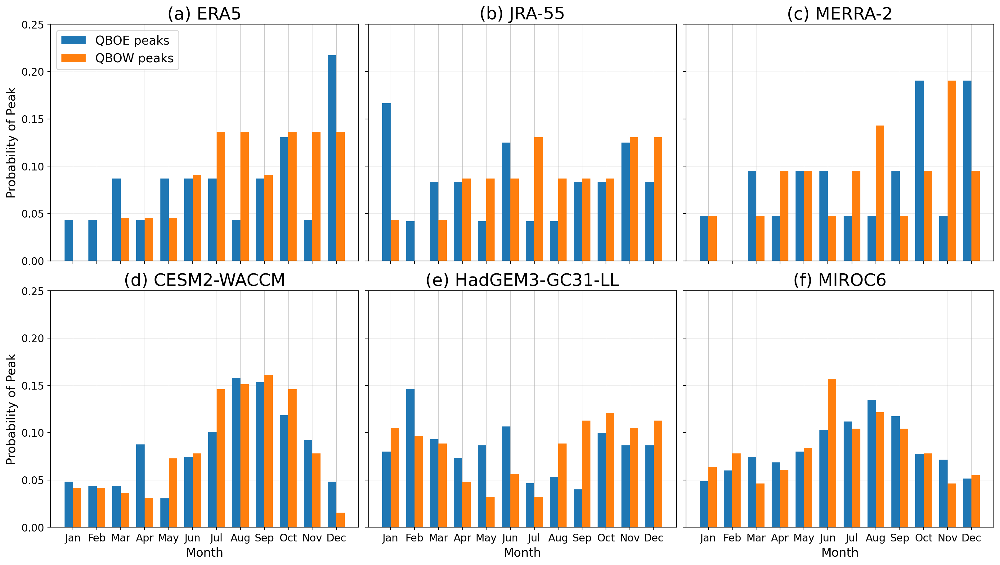

In [12]:
month_labels = ["Jan","Feb","Mar","Apr","May","Jun",
                "Jul","Aug","Sep","Oct","Nov","Dec"]

width = 0.35  # width of the bars

fig, axs = plt.subplots(
    2, 3,
    figsize=(16, 9),
    dpi=200,
    sharey=True,
    constrained_layout=True
)

# ---- ERA5 ----
axs[0,0].bar(months - width/2, east_prob_era5, width, label="QBOE peaks")
axs[0,0].bar(months + width/2, west_prob_era5, width, label="QBOW peaks")
axs[0,0].set_title("(a) ERA5", fontsize=20)

# ---- JRA-55 ----
axs[0,1].bar(months - width/2, east_prob_jra55, width, label="QBOE peaks")
axs[0,1].bar(months + width/2, west_prob_jra55, width, label="QBOW peaks")
axs[0,1].set_title("(b) JRA-55", fontsize=20)

# ---- MERRA-2 ----
axs[0,2].bar(months - width/2, east_prob_merra2, width, label="QBOE peaks")
axs[0,2].bar(months + width/2, west_prob_merra2, width, label="QBOW peaks")
axs[0,2].set_title("(c) MERRA-2", fontsize=20)

selected = ["CESM2-WACCM", "HadGEM3-GC31-LL", "MIROC6"]
d_to_f = ["(d)", "(e)", "(f)"]

for i, (ax, name) in enumerate(zip(axs[1, :], selected)):
    east_counts, west_counts = results[name]   # results[name] = (east, west)
    east_prob = east_counts / east_counts.sum()
    west_prob = west_counts / west_counts.sum()
    ax.bar(months - width/2, east_prob, width, label="QBOE peaks")
    ax.bar(months + width/2, west_prob, width, label="QBOW peaks")
    ax.set_title(f"{d_to_f[i]} {name}", fontsize=20)

for ax in axs.flatten():
    ax.set_xticks(months)
    ax.set_xticklabels(month_labels)
    ax.set_xlabel("Month", fontsize=14)
    ax.set_axisbelow(True)
    ax.grid(lw=0.25)
    ax.label_outer()
    ax.set_ylim(0,0.25)
    ax.tick_params(axis='both', labelsize=12)
axs[0,0].legend(frameon=True, loc="upper left", fontsize=14)
axs[0,0].set_ylabel("Probability of Peak", fontsize=14)
axs[1,0].set_ylabel("Probability of Peak", fontsize=14)

plt.savefig(
    "/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/figure1.pdf",
    format="pdf",
    bbox_inches="tight"
)
plt.show()

In [13]:
def fit_annual_sine(months, y):
    """Fit y(m) with a single annual harmonic and return amplitude & phase."""
    omega = 2 * np.pi / 12.0  # annual cycle

    # Design matrix: sin, cos, constant
    X = np.column_stack([
        np.sin(omega * months),
        np.cos(omega * months),
        np.ones_like(months)
    ])

    (a, b, c), *_ = np.linalg.lstsq(X, y, rcond=None)

    # Convert to amplitude/phase form
    A = np.hypot(a, b)
    phi = np.arctan2(b, a)
    m_peak = (0.5 * np.pi - phi) / omega  # month where sine hits max

    y_fit = A * np.sin(omega * months + phi) + c

    return A, phi, c, m_peak, y_fit

In [14]:
obs_probs = {
    "ERA5": {
        "east": east_prob_era5,
        "west": west_prob_era5,
    },
    "JRA55": {
        "east": east_prob_jra55,
        "west": west_prob_jra55,
    },
    "MERRA2": {
        "east": east_prob_merra2,
        "west": west_prob_merra2,
    },
}

obs_fit_results = {}

for obs_name, d in obs_probs.items():
    A_e, phi_e, c_e, mpeak_e, yfit_e = fit_annual_sine(months, d["east"])
    A_w, phi_w, c_w, mpeak_w, yfit_w = fit_annual_sine(months, d["west"])

    obs_fit_results[obs_name] = {
        "east": {
            "A": A_e,
            "phi": phi_e,
            "offset": c_e,
            "peak_month": (mpeak_e - 1) % 12 + 1,
            "fit_curve": yfit_e,
        },
        "west": {
            "A": A_w,
            "phi": phi_w,
            "offset": c_w,
            "peak_month": (mpeak_w - 1) % 12 + 1,
            "fit_curve": yfit_w,
        },
    }

In [15]:
obs_style_map = {
    "ERA5":   {"marker": "X", "color": "gray"},
    "JRA55":  {"marker": "P", "color": "gray"},
    "MERRA2": {"marker": "D", "color": "gray"},
}

# Figure 2: Distribution of CMIP6 Seasonality

In [16]:
with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/seasonal_fit.pkl", "rb") as f:
    fit_results = pickle.load(f)

with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/seasonal_fit_prob.pkl", "rb") as f:
    fit_results_prob = pickle.load(f)

In [17]:
obs_styles = {
    "ERA5":   {"marker": "s", "label": "ERA5", "facecolor":"dimgray", "edgecolor":"red", "linewidths":1.6},
    "JRA55":  {"marker": "^", "label": "JRA-55", "facecolor":"dimgray", "edgecolor":"red", "linewidths":1.6},
    "MERRA2": {"marker": "D", "label": "MERRA-2", "facecolor":"dimgray", "edgecolor":"red", "linewidths":1.6},
}

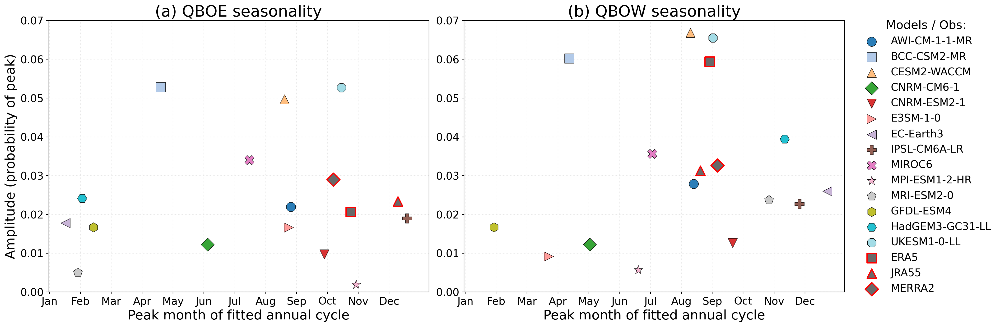

In [18]:
AMP_KEYS   = ("A", "amplitude", "amp", "fit_amp")
PHASE_KEYS = ("peak_month",)
PHASE_UNITS = "month"

def pick(d, keys): return next(d[k] for k in keys if k in d)

def phase_to_month(phi, units="month"):
    phi = np.asarray(phi, float)
    if units == "radian": phi = phi * 12/(2*np.pi)
    m = phi % 12
    return np.where(m == 0, 12, m)

models = [m for m in style_map if m in fit_results_prob]

E = np.array([
    [pick(fit_results_prob[m]["east"], AMP_KEYS),
     pick(fit_results_prob[m]["east"], PHASE_KEYS)]
    for m in models
], float)

W = np.array([
    [pick(fit_results_prob[m]["west"], AMP_KEYS),
     pick(fit_results_prob[m]["west"], PHASE_KEYS)]
    for m in models
], float)

fig, ax = plt.subplots(1, 2, figsize=(18, 7), dpi=200, sharex=True)

for a, title, Aphi, qbo_phase in [
    (ax[0], "(a) QBOE", E, "east"),
    (ax[1], "(b) QBOW", W, "west"),
]:

    amp = Aphi[:, 0]
    month = Aphi[:, 1]

    for i, m in enumerate(models):
        st = style_map[m]
        a.scatter(month[i], amp[i], s=200, marker=st["marker"], facecolor=st["color"], edgecolor="k", linewidth=0.6, alpha=0.95, label=m, zorder=3)

    # add observations
    for obs_name, st in obs_styles.items():
        phase_obs = obs_fit_results[obs_name][qbo_phase]["peak_month"]
        amp_obs   = obs_fit_results[obs_name][qbo_phase]["A"]

        a.scatter(phase_obs, amp_obs, s=200, marker=st["marker"], facecolor=st["facecolor"], edgecolor=st["edgecolor"], linewidth=1.8, label=obs_name, zorder=6)

    a.set_title(f"{title} seasonality", fontsize=24)
    a.set_xlabel("Peak month of fitted annual cycle", fontsize=20)
    a.set_xticks(np.arange(1, 13))
    a.set_xticklabels(month_labels)
    a.tick_params(axis="both", labelsize=16)
    a.set_ylim(0,0.07)
    a.grid(alpha=0.3, linestyle=":")

ax[0].set_ylabel("Amplitude (probability of peak)", fontsize=20)

# one shared legend outside
h, lab = ax[0].get_legend_handles_labels()
fig.legend(h, lab, loc="center left", bbox_to_anchor=(1, 0.52), fontsize=16,
           frameon=False, title="Models / Obs:", title_fontsize=18)

fig.tight_layout()
plt.savefig("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/figure2-with-obs.pdf",
            format="pdf", bbox_inches="tight")
plt.show()

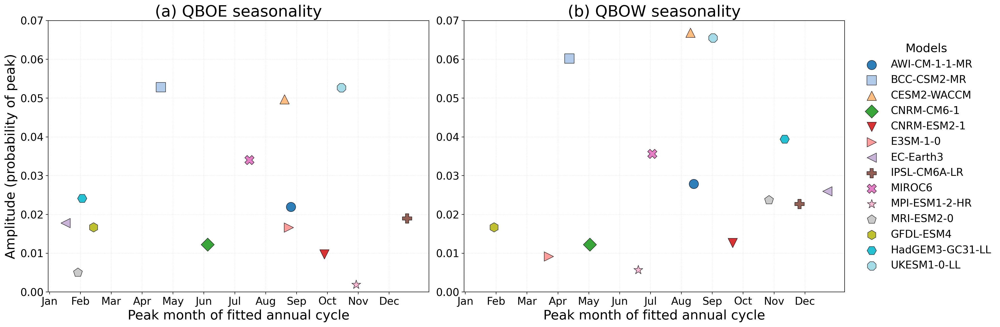

In [19]:
AMP_KEYS   = ("A", "amplitude", "amp", "fit_amp")
PHASE_KEYS = ("peak_month",)
PHASE_UNITS = "month"

def pick(d, keys): return next(d[k] for k in keys if k in d)

def phase_to_month(phi, units="month"):
    phi = np.asarray(phi, float)
    if units == "radian": phi = phi * 12/(2*np.pi)
    m = phi % 12
    return np.where(m == 0, 12, m)

models = [m for m in style_map if m in fit_results_prob]

E = np.array([
    [pick(fit_results_prob[m]["east"], AMP_KEYS),
     pick(fit_results_prob[m]["east"], PHASE_KEYS)]
    for m in models
], float)

W = np.array([
    [pick(fit_results_prob[m]["west"], AMP_KEYS),
     pick(fit_results_prob[m]["west"], PHASE_KEYS)]
    for m in models
], float)

fig, ax = plt.subplots(1, 2, figsize=(18, 7), dpi=200, sharex=True)

for a, title, Aphi, qbo_phase in [
    (ax[0], "(a) QBOE", E, "east"),
    (ax[1], "(b) QBOW", W, "west"),
]:

    amp = Aphi[:, 0]
    month = Aphi[:, 1]

    for i, m in enumerate(models):
        st = style_map[m]
        a.scatter(month[i], amp[i], s=200, marker=st["marker"], facecolor=st["color"], edgecolor="k", linewidth=0.6, alpha=0.95, label=m, zorder=3)

    a.set_title(f"{title} seasonality", fontsize=24)
    a.set_xlabel("Peak month of fitted annual cycle", fontsize=20)
    a.set_xticks(np.arange(1, 13))
    a.set_xticklabels(month_labels)
    a.tick_params(axis="both", labelsize=16)
    a.set_ylim(0,0.07)
    a.grid(alpha=0.3, linestyle=":")
    

ax[0].set_ylabel("Amplitude (probability of peak)", fontsize=20)

# one shared legend outside
h, lab = ax[0].get_legend_handles_labels()
fig.legend(h, lab, loc="center left", bbox_to_anchor=(1, 0.52), fontsize=16,
           frameon=False, title="Models", title_fontsize=18)

fig.tight_layout()
plt.savefig("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/figure2.pdf",
            format="pdf", bbox_inches="tight")
plt.show()

# Figure 3: RMS Annual Cycle vs ENSO Analysis

In [20]:
model_names_Fz = [
    "CESM2-WACCM", "CNRM-CM6-1", "CNRM-ESM2-1", "EC-Earth3",
    "GFDL-ESM4", "IPSL-CM6A-LR", "MIROC6", "MPI-ESM1-2-HR", "MRI-ESM2-0"
]

data_dir = "/glade/u/home/kkoepnick/qbo-enso/saved_data/"
EP_fluxes = {}

for name in model_names_Fz:
    print(f"===== {name} =====")
    fn = os.path.join(data_dir, f"{name}_Fz_latmean_daily.nc")

    ds = xr.open_dataset(fn, engine="netcdf4")   # engine optional, but explicit is fine
    da = ds["Fz_latmean"]                        # DataArray

    Fz_month = (
        da.groupby("time.month")
          .mean("time")
          .sortby("month")
    )

    EP_fluxes[name] = Fz_month

===== CESM2-WACCM =====
===== CNRM-CM6-1 =====


/glade/u/home/kkoepnick/my_conda_envs/my-npl/lib/python3.11/site-packages/xarray/coding/times.py:987: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/glade/u/home/kkoepnick/my_conda_envs/my-npl/lib/python3.11/site-packages/xarray/core/indexing.py:525: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)
/glade/u/home/kkoepnick/my_conda_envs/my-npl/lib/python3.11/site-packages/xarray/coding/times.py:987: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)

===== CNRM-ESM2-1 =====
===== EC-Earth3 =====


/glade/u/home/kkoepnick/my_conda_envs/my-npl/lib/python3.11/site-packages/xarray/core/indexing.py:525: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)


===== GFDL-ESM4 =====
===== IPSL-CM6A-LR =====


/glade/u/home/kkoepnick/my_conda_envs/my-npl/lib/python3.11/site-packages/xarray/coding/times.py:987: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/glade/u/home/kkoepnick/my_conda_envs/my-npl/lib/python3.11/site-packages/xarray/core/indexing.py:525: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)


===== MIROC6 =====


/glade/u/home/kkoepnick/my_conda_envs/my-npl/lib/python3.11/site-packages/xarray/coding/times.py:987: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/glade/u/home/kkoepnick/my_conda_envs/my-npl/lib/python3.11/site-packages/xarray/core/indexing.py:525: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)
/glade/u/home/kkoepnick/my_conda_envs/my-npl/lib/python3.11/site-packages/xarray/coding/times.py:987: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)

===== MPI-ESM1-2-HR =====
===== MRI-ESM2-0 =====


/glade/u/home/kkoepnick/my_conda_envs/my-npl/lib/python3.11/site-packages/xarray/core/indexing.py:525: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)


In [21]:
P_MIN_HPA = 500
P_MAX_HPA = 70

plev_maxvar = {}
rms_at_maxvar = {}

for name, da0 in EP_fluxes.items():
    # ensure shape (plev, month) and plev in Pa
    da = da0.transpose("plev", "month")
    p_hPa = da["plev"] / 100.0

    # restrict search band
    band = da.where((p_hPa <= P_MIN_HPA) & (p_hPa >= P_MAX_HPA), drop=True)

    # max variance across month at each plev
    var_by_plev = band.var("month", skipna=True)          # (plev)
    p_star = float(var_by_plev.idxmax("plev").values)     # Pa

    plev_maxvar[name] = p_star

    # RMS across months at that pressure
    da_p = da.sel(plev=p_star, method="nearest")          # (month)
    rms = float(np.sqrt((da_p**2).mean("month", skipna=True)).values)
    rms_at_maxvar[name] = rms

print("Computed max-variance pressure + RMS for", len(plev_maxvar), "models.")

Computed max-variance pressure + RMS for 9 models.


In [22]:
# def fit_and_plot_bootstrap(ax, x, y, deg=1, nboot=5000, ci=95,
#                            show_r2_ci=False,
#                            line_kw=None, fill_kw=None, text_kw=None):
#     """
#     Fit polynomial of degree `deg`, plot best-fit line + bootstrap CI band,
#     and annotate R^2 (optionally with bootstrap CI for R^2).

#     Bootstrap resamples (x_i, y_i) pairs.
#     """
#     x = np.asarray(x, dtype=float)
#     y = np.asarray(y, dtype=float)

#     m = np.isfinite(x) & np.isfinite(y)
#     x = x[m]; y = y[m]
#     if len(x) < deg + 1:
#         return np.nan

#     # ----- best fit -----
#     coeff = np.polyfit(x, y, deg=deg)
#     p = np.poly1d(coeff)

#     xs = np.linspace(x.min(), x.max(), 200)
#     ys = p(xs)

#     if line_kw is None:
#         line_kw = dict(linewidth=2, zorder=2, color="k", linestyle="dashed")
#     ax.plot(xs, ys, **line_kw)

#     # R^2 on original data
#     yhat = p(x)
#     ss_res = np.sum((y - yhat)**2)
#     ss_tot = np.sum((y - np.mean(y))**2)
#     r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

#     # ----- bootstrap band -----
#     n = len(x)
#     y_boot = np.empty((nboot, xs.size))
#     r2_boot = np.empty(nboot) if show_r2_ci else None

#     for i in range(nboot):
#         idx = np.random.randint(0, n, n)  # resample pairs
#         xb = x[idx]; yb = y[idx]

#         cb = np.polyfit(xb, yb, deg=deg)
#         pb = np.poly1d(cb)

#         y_boot[i, :] = pb(xs)

#         if show_r2_ci:
#             yb_hat = pb(xb)
#             ss_res_b = np.sum((yb - yb_hat)**2)
#             ss_tot_b = np.sum((yb - np.mean(yb))**2)
#             r2_boot[i] = 1 - ss_res_b / ss_tot_b if ss_tot_b > 0 else np.nan

#     alpha = (100 - ci) / 2
#     lo = np.nanpercentile(y_boot, alpha, axis=0)
#     hi = np.nanpercentile(y_boot, 100 - alpha, axis=0)

#     if fill_kw is None:
#         fill_kw = dict(color="k", alpha=0.20, zorder=1)
#     ax.fill_between(xs, lo, hi, **fill_kw)

#     # ----- annotate -----
#     if text_kw is None:
#         text_kw = dict(fontsize=18,
#                        bbox=dict(boxstyle="round", alpha=0.15, edgecolor="none"))

#     if show_r2_ci and r2_boot is not None:
#         r2_lo = np.nanpercentile(r2_boot, alpha)
#         r2_hi = np.nanpercentile(r2_boot, 100 - alpha)
#         txt = rf"$R^2$ = {r2:.2f}" + "\n" + rf"{ci:.0f}% CI [{r2_lo:.2f}, {r2_hi:.2f}]"
#     else:
#         txt = rf"$R^2$ = {r2:.2f}"

#     ax.text(0.03, 0.97, txt, transform=ax.transAxes,
#             va="top", ha="left", **text_kw)

#     return r2

def fit_and_plot_bootstrap(ax, x, y, deg=1, nboot=5000, ci=95,
                           block_size=None,
                           show_r2_ci=False,
                           line_kw=None, fill_kw=None, text_kw=None):
    """
    Fit polynomial of degree `deg`, plot best-fit line + bootstrap CI band,
    and annotate R^2.

    If block_size is None:
        resample individual (x, y) pairs.

    If block_size is an integer:
        resample consecutive blocks of length block_size.
        For monthly data, use block_size=12 for year-block bootstrapping.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    m = np.isfinite(x) & np.isfinite(y)
    x = x[m]
    y = y[m]

    if len(x) < deg + 1:
        return np.nan

    # ----- best fit -----
    coeff = np.polyfit(x, y, deg=deg)
    p = np.poly1d(coeff)

    xs = np.linspace(x.min(), x.max(), 200)
    ys = p(xs)

    if line_kw is None:
        line_kw = dict(linewidth=2, zorder=2, color="k", linestyle="dashed")
    ax.plot(xs, ys, **line_kw)

    # R^2 on original data
    yhat = p(x)
    ss_res = np.sum((y - yhat)**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

    # ----- bootstrap setup -----
    n = len(x)

    if block_size is not None:
        nblocks = n // block_size

        if nblocks < 1:
            raise ValueError(
                f"block_size={block_size} is larger than sample size n={n}. "
                "Use block_size=None for model-by-model scatter plots."
            )

        n_use = nblocks * block_size
        x_use = x[:n_use]
        y_use = y[:n_use]

        block_indices = [
            np.arange(j * block_size, (j + 1) * block_size)
            for j in range(nblocks)
        ]

    y_boot = np.empty((nboot, xs.size))
    r2_boot = np.empty(nboot) if show_r2_ci else None

    for i in range(nboot):

        if block_size is None:
            # ordinary bootstrap across individual points
            idx = np.random.randint(0, n, n)
            xb = x[idx]
            yb = y[idx]

        else:
            # block bootstrap
            sampled_blocks = np.random.randint(0, nblocks, nblocks)
            idx = np.concatenate([block_indices[j] for j in sampled_blocks])

            xb = x_use[idx]
            yb = y_use[idx]

        cb = np.polyfit(xb, yb, deg=deg)
        pb = np.poly1d(cb)

        y_boot[i, :] = pb(xs)

        if show_r2_ci:
            yb_hat = pb(xb)
            ss_res_b = np.sum((yb - yb_hat)**2)
            ss_tot_b = np.sum((yb - np.mean(yb))**2)
            r2_boot[i] = 1 - ss_res_b / ss_tot_b if ss_tot_b > 0 else np.nan

    alpha = (100 - ci) / 2
    lo = np.nanpercentile(y_boot, alpha, axis=0)
    hi = np.nanpercentile(y_boot, 100 - alpha, axis=0)

    if fill_kw is None:
        fill_kw = dict(color="k", alpha=0.20, zorder=1)
    ax.fill_between(xs, lo, hi, **fill_kw)

    # ----- annotate -----
    if text_kw is None:
        text_kw = dict(
            fontsize=18,
            bbox=dict(boxstyle="round", alpha=0.15, edgecolor="none")
        )

    if show_r2_ci and r2_boot is not None:
        r2_lo = np.nanpercentile(r2_boot, alpha)
        r2_hi = np.nanpercentile(r2_boot, 100 - alpha)
        txt = rf"$R^2$ = {r2:.2f}" + "\n" + rf"{ci:.0f}% CI [{r2_lo:.2f}, {r2_hi:.2f}]"
    else:
        txt = rf"$R^2$ = {r2:.2f}"

    ax.text(0.03, 0.97, txt, transform=ax.transAxes,
            va="top", ha="left", **text_kw)

    return r2

def rms_seasonal_cycle(x):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    return np.sqrt(np.mean((x - x.mean())**2)) if x.size else np.nan

In [23]:
qboe_rms_bars = {}
qbow_rms_bars = {}
qbo_rms_bars = {}

qboe_rms_prob = {}
qbow_rms_prob = {}
qbo_rms_prob = {}

for name, (east_counts, west_counts) in results.items():
    print(f"Calculating QBO RMS for {name}...")
    east_prob = east_counts / east_counts.sum()
    west_prob = west_counts / west_counts.sum()
    total_counts = east_counts + west_counts
    total_prob = total_counts / total_counts.sum()
    
    qboe_rms_bars[name] = rms_seasonal_cycle(east_counts)
    qbow_rms_bars[name] = rms_seasonal_cycle(west_counts)
    qbo_rms_bars[name] = rms_seasonal_cycle(total_counts)

    qboe_rms_prob[name] = rms_seasonal_cycle(east_prob)
    qbow_rms_prob[name] = rms_seasonal_cycle(west_prob)
    qbo_rms_prob[name] = rms_seasonal_cycle(total_prob)

Calculating QBO RMS for AWI-CM-1-1-MR...
Calculating QBO RMS for BCC-CSM2-MR...
Calculating QBO RMS for CESM2-WACCM...
Calculating QBO RMS for CNRM-CM6-1...
Calculating QBO RMS for CNRM-ESM2-1...
Calculating QBO RMS for E3SM-1-0...
Calculating QBO RMS for EC-Earth3...
Calculating QBO RMS for GFDL-ESM4...
Calculating QBO RMS for HadGEM3-GC31-LL...
Calculating QBO RMS for IPSL-CM6A-LR...
Calculating QBO RMS for MIROC6...
Calculating QBO RMS for MPI-ESM1-2-HR...
Calculating QBO RMS for MRI-ESM2-0...
Calculating QBO RMS for UKESM1-0-LL...


In [24]:
epf_pmax_seasonal = {}   # hPa
epf_rms = {}

for name in model_names_Fz:
    da0 = EP_fluxes[name]  # (month, plev) DataArray, plev in Pa
    da = da0.transpose("plev", "month")
    p_star_pa = float(plev_maxvar[name])
    p_star_hpa = p_star_pa / 100.0
    epf_pmax_seasonal[name] = p_star_hpa
    epf_monthly = da.sel(plev=p_star_pa, method="nearest").values  # shape (12,)

    # RMS of the seasonal cycle
    epf_rms[name] = rms_seasonal_cycle(epf_monthly) / 10**5

    print(f"{name}: pmax(var band)={p_star_hpa:.1f} hPa ; RMS={epf_rms[name]:.4g}")

CESM2-WACCM: pmax(var band)=250.0 hPa ; RMS=0.3297
CNRM-CM6-1: pmax(var band)=250.0 hPa ; RMS=0.249
CNRM-ESM2-1: pmax(var band)=250.0 hPa ; RMS=0.2291
EC-Earth3: pmax(var band)=250.0 hPa ; RMS=0.3228
GFDL-ESM4: pmax(var band)=300.0 hPa ; RMS=0.283
IPSL-CM6A-LR: pmax(var band)=250.0 hPa ; RMS=0.1874
MIROC6: pmax(var band)=250.0 hPa ; RMS=0.2335
MPI-ESM1-2-HR: pmax(var band)=250.0 hPa ; RMS=0.2728
MRI-ESM2-0: pmax(var band)=250.0 hPa ; RMS=0.3668


In [25]:
with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/el_nino_counts_by_model.pkl", "rb") as f:
    el_nino_counts_by_model = pickle.load(f)

with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/la_nina_counts_by_model.pkl", "rb") as f:
    la_nina_counts_by_model = pickle.load(f)

In [26]:
elnino_rms_bars = {}
lanina_rms_bars = {}
enso_rms_bars   = {}

elnino_rms_prob = {}
lanina_rms_prob = {}
enso_rms_prob   = {}

for name in el_nino_counts_by_model.keys():
    en = np.asarray(el_nino_counts_by_model[name], float)
    ln = np.asarray(la_nina_counts_by_model[name], float)
    en_prob = en / en.sum()
    ln_prob = ln / ln.sum()
    total_prob = (en + ln) / (en + ln).sum()
    
    elnino_rms_bars[name] = rms_seasonal_cycle(en)
    lanina_rms_bars[name] = rms_seasonal_cycle(ln)
    enso_rms_bars[name]   = rms_seasonal_cycle(en+ln)

    elnino_rms_prob[name] = rms_seasonal_cycle(en_prob)
    lanina_rms_prob[name] = rms_seasonal_cycle(ln_prob)
    enso_rms_prob[name]   = rms_seasonal_cycle(total_prob)

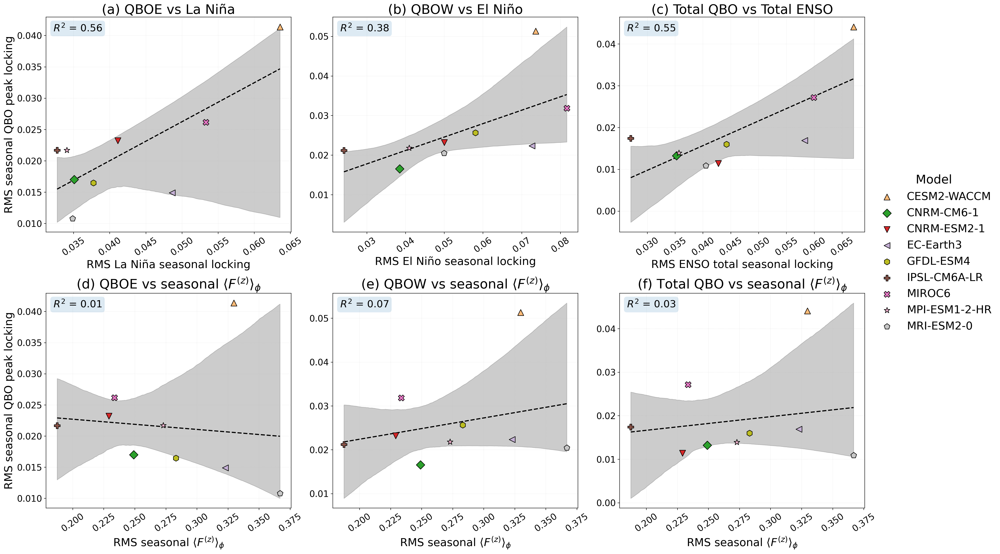

In [27]:
# --- one figure: 2 rows x 3 cols ---
fig, axes = plt.subplots(2, 3, figsize=(22, 14), dpi=200, sharey=False)

handles, labels = [], []
# ============================================================
# Row 2: ENSO vs QBO (same as your second plot)
#   - keep your simple filter: only use EPF models
# ============================================================
models_enso = sorted(
    set(lanina_rms_prob) &
    set(elnino_rms_prob) &
    set(enso_rms_prob) &
    set(qboe_rms_prob) &
    set(qbow_rms_prob) &
    set(qbo_rms_prob)
)

x1_all, y1_all = [], []
x2_all, y2_all = [], []
x3_all, y3_all = [], []

for name in models_enso:
    if name not in epf_rms:
        continue  # only keep EPF models

    if name in style_map:
        mk  = style_map[name]["marker"]
        col = style_map[name]["color"]
    else:
        mk, col = "o", "0.5"

    x1 = lanina_rms_prob[name]; y1 = qboe_rms_prob[name]
    x2 = elnino_rms_prob[name]; y2 = qbow_rms_prob[name]
    x3 = enso_rms_prob[name];   y3 = qbo_rms_prob[name]

    x1_all.append(x1); y1_all.append(y1)
    x2_all.append(x2); y2_all.append(y2)
    x3_all.append(x3); y3_all.append(y3)

    axes[0, 0].scatter(x1, y1, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[0, 1].scatter(x2, y2, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[0, 2].scatter(x3, y3, s=120, marker=mk, color=col, edgecolor="k", zorder=3)

deg = 1
fit_and_plot_bootstrap(axes[0, 0], np.array(x1_all), np.array(y1_all), deg=deg, block_size=None)
fit_and_plot_bootstrap(axes[0, 1], np.array(x2_all), np.array(y2_all), deg=deg, block_size=None)
fit_and_plot_bootstrap(axes[0, 2], np.array(x3_all), np.array(y3_all), deg=deg, block_size=None)

titles_row2 = ["(a) QBOE vs La Niña", "(b) QBOW vs El Niño", "(c) Total QBO vs Total ENSO"]
xlabels_row2 = ["RMS La Niña seasonal locking",
                "RMS El Niño seasonal locking",
                "RMS ENSO total seasonal locking"]

for ax, title, xl in zip(axes[0, :], titles_row2, xlabels_row2):
    ax.set_title(title, fontsize=24)
    ax.set_xlabel(xl, fontsize=20)
    ax.grid(alpha=0.3, linestyle=":")
    ax.tick_params(axis="both", labelsize=16)
    ax.tick_params(axis="x", labelrotation=35)
    #ax.set_ylim(2, 22)
    #ax.label_outer()

axes[0, 0].set_ylabel("RMS seasonal QBO peak locking", fontsize=20)

# ============================================================
# Row 2: EPF vs QBO (same as your first plot)
# ============================================================
models_epf = sorted(set(epf_rms) & set(qboe_rms_prob) & set(qbow_rms_prob) & set(qbo_rms_prob))

x_all, y_e_all, y_w_all, y_t_all = [], [], [], []

for name in models_epf:
    if name in style_map:
        mk  = style_map[name]["marker"]
        col = style_map[name]["color"]
    else:
        mk, col = "o", "0.5"

    x  = epf_rms[name]
    yE = qboe_rms_prob[name]
    yW = qbow_rms_prob[name]
    yT = qbo_rms_prob[name]

    x_all.append(x);  y_e_all.append(yE);  y_w_all.append(yW);  y_t_all.append(yT)

    h = axes[1, 0].scatter(x, yE, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[1, 1].scatter(x, yW, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[1, 2].scatter(x, yT, s=120, marker=mk, color=col, edgecolor="k", zorder=3)

    handles.append(h)
    labels.append(name)

deg = 1
X  = np.array(x_all, dtype=float)
YE = np.array(y_e_all, dtype=float)
YW = np.array(y_w_all, dtype=float)
YT = np.array(y_t_all, dtype=float)

fit_and_plot_bootstrap(axes[1, 0], X, YE, deg=deg, block_size=None)
fit_and_plot_bootstrap(axes[1, 1], X, YW, deg=deg, block_size=None)
fit_and_plot_bootstrap(axes[1, 2], X, YT, deg=deg, block_size=None)

titles_row1 = [r"(d) QBOE vs seasonal $\langle F^{(z)} \rangle_\phi$", 
               r"(e) QBOW vs seasonal $\langle F^{(z)} \rangle_\phi$", 
               r"(f) Total QBO vs seasonal $\langle F^{(z)} \rangle_\phi$"]
for ax, title in zip(axes[1, :], titles_row1):
    ax.set_title(title, fontsize=24)
    ax.set_xlabel(r"RMS seasonal $\langle F^{(z)} \rangle_\phi$", fontsize=20)
    ax.grid(alpha=0.3, linestyle=":")
    ax.tick_params(axis="both", labelsize=16)
    ax.tick_params(axis="x", labelrotation=35)
    #ax.set_ylim(1, 22)

axes[1, 0].set_ylabel("RMS seasonal QBO peak locking", fontsize=20)

# --- one legend for the whole figure ---
fig.legend(handles, labels, bbox_to_anchor=(1.15,0.7), fontsize=20,
           frameon=False, title="Model", title_fontsize=22)

plt.tight_layout()
# plt.savefig("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/figure3_updated.pdf",
#             format="pdf", bbox_inches="tight")
plt.show()

In [28]:
with open("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/sensitivity_results.pkl", "rb") as f:
    sensitivity_results = pickle.load(f)

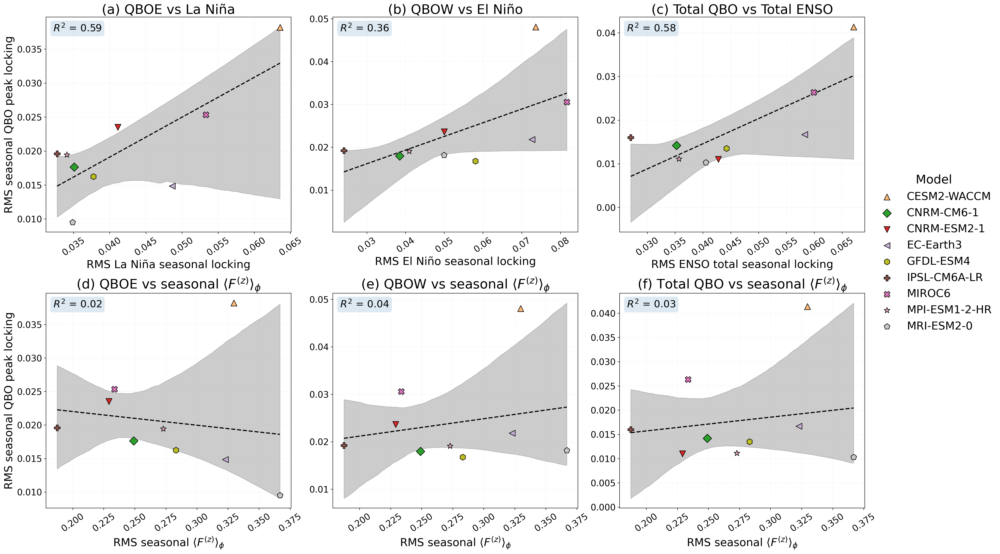

In [29]:
case_to_plot = "1sigma_15mo"
exclude_models = []

qboe_case = sensitivity_results[case_to_plot]["qboe_rms_prob"]
qbow_case = sensitivity_results[case_to_plot]["qbow_rms_prob"]
qbo_case  = sensitivity_results[case_to_plot]["qbo_rms_prob"]

# --- one figure: 2 rows x 3 cols ---
fig, axes = plt.subplots(2, 3, figsize=(22, 14), dpi=200, sharey=False)

handles, labels = [], []
# ============================================================
# Row 2: ENSO vs QBO (same as your second plot)
#   - keep your simple filter: only use EPF models
# ============================================================
models_enso = sorted(
    set(lanina_rms_prob) &
    set(elnino_rms_prob) &
    set(enso_rms_prob) &
    set(qboe_case) &
    set(qbow_case) &
    set(qbo_case)
)
models_enso = [m for m in models_enso if m not in exclude_models]
x1_all, y1_all = [], []
x2_all, y2_all = [], []
x3_all, y3_all = [], []

for name in models_enso:
    if name not in epf_rms:
        continue  # only keep EPF models

    if name in style_map:
        mk  = style_map[name]["marker"]
        col = style_map[name]["color"]
    else:
        mk, col = "o", "0.5"

    x1 = lanina_rms_prob[name]; y1 = qboe_case[name]
    x2 = elnino_rms_prob[name]; y2 = qbow_case[name]
    x3 = enso_rms_prob[name];   y3 = qbo_case[name]

    x1_all.append(x1); y1_all.append(y1)
    x2_all.append(x2); y2_all.append(y2)
    x3_all.append(x3); y3_all.append(y3)

    axes[0, 0].scatter(x1, y1, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[0, 1].scatter(x2, y2, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[0, 2].scatter(x3, y3, s=120, marker=mk, color=col, edgecolor="k", zorder=3)

deg = 1
fit_and_plot_bootstrap(axes[0, 0], np.array(x1_all), np.array(y1_all), deg=deg)
fit_and_plot_bootstrap(axes[0, 1], np.array(x2_all), np.array(y2_all), deg=deg)
fit_and_plot_bootstrap(axes[0, 2], np.array(x3_all), np.array(y3_all), deg=deg)

titles_row2 = ["(a) QBOE vs La Niña", "(b) QBOW vs El Niño", "(c) Total QBO vs Total ENSO"]
xlabels_row2 = ["RMS La Niña seasonal locking",
                "RMS El Niño seasonal locking",
                "RMS ENSO total seasonal locking"]

for ax, title, xl in zip(axes[0, :], titles_row2, xlabels_row2):
    ax.set_title(title, fontsize=24)
    ax.set_xlabel(xl, fontsize=20)
    ax.grid(alpha=0.3, linestyle=":")
    ax.tick_params(axis="both", labelsize=16)
    ax.tick_params(axis="x", labelrotation=35)
    #ax.set_ylim(2, 22)
    #ax.label_outer()

axes[0, 0].set_ylabel("RMS seasonal QBO peak locking", fontsize=20)

# ============================================================
# Row 2: EPF vs QBO (same as your first plot)
# ============================================================
models_epf = sorted(set(epf_rms) & set(qboe_case) & set(qbow_case) & set(qbo_case))
models_epf = [m for m in models_epf if m not in exclude_models]
x_all, y_e_all, y_w_all, y_t_all = [], [], [], []

for name in models_epf:
    if name in style_map:
        mk  = style_map[name]["marker"]
        col = style_map[name]["color"]
    else:
        mk, col = "o", "0.5"

    x  = epf_rms[name]
    yE = qboe_case[name]
    yW = qbow_case[name]
    yT = qbo_case[name]

    x_all.append(x);  y_e_all.append(yE);  y_w_all.append(yW);  y_t_all.append(yT)

    h = axes[1, 0].scatter(x, yE, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[1, 1].scatter(x, yW, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[1, 2].scatter(x, yT, s=120, marker=mk, color=col, edgecolor="k", zorder=3)

    handles.append(h)
    labels.append(name)

deg = 1
X  = np.array(x_all, dtype=float)
YE = np.array(y_e_all, dtype=float)
YW = np.array(y_w_all, dtype=float)
YT = np.array(y_t_all, dtype=float)

fit_and_plot_bootstrap(axes[1, 0], X, YE, deg=deg)
fit_and_plot_bootstrap(axes[1, 1], X, YW, deg=deg)
fit_and_plot_bootstrap(axes[1, 2], X, YT, deg=deg)

titles_row1 = [r"(d) QBOE vs seasonal $\langle F^{(z)} \rangle_\phi$", 
               r"(e) QBOW vs seasonal $\langle F^{(z)} \rangle_\phi$", 
               r"(f) Total QBO vs seasonal $\langle F^{(z)} \rangle_\phi$"]
for ax, title in zip(axes[1, :], titles_row1):
    ax.set_title(title, fontsize=24)
    ax.set_xlabel(r"RMS seasonal $\langle F^{(z)} \rangle_\phi$", fontsize=20)
    ax.grid(alpha=0.3, linestyle=":")
    ax.tick_params(axis="both", labelsize=16)
    ax.tick_params(axis="x", labelrotation=35)
    #ax.set_ylim(1, 22)

axes[1, 0].set_ylabel("RMS seasonal QBO peak locking", fontsize=20)

# --- one legend for the whole figure ---
fig.legend(handles, labels, bbox_to_anchor=(1.15,0.7), fontsize=20,
           frameon=False, title="Model", title_fontsize=22)

plt.tight_layout()
plt.savefig("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/figure3_threshold.pdf",
            format="pdf", bbox_inches="tight")
plt.show()

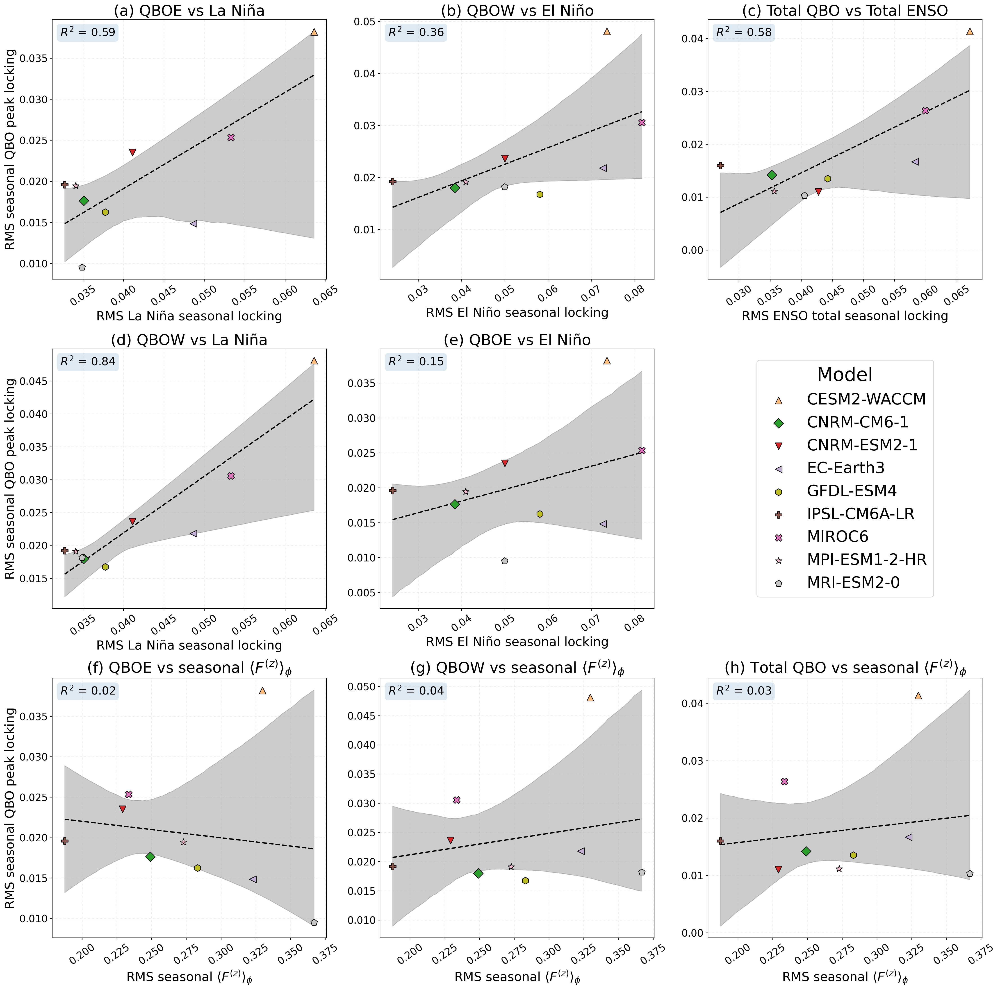

In [30]:
case_to_plot = "1sigma_15mo"
exclude_models = []

qboe_case = sensitivity_results[case_to_plot]["qboe_rms_prob"]
qbow_case = sensitivity_results[case_to_plot]["qbow_rms_prob"]
qbo_case  = sensitivity_results[case_to_plot]["qbo_rms_prob"]

# --- one figure: 2 rows x 3 cols ---
fig, axes = plt.subplots(3, 3, figsize=(22, 22), dpi=200, sharey=False)

handles, labels = [], []
# ============================================================
# Row 2: ENSO vs QBO (same as your second plot)
#   - keep your simple filter: only use EPF models
# ============================================================
models_enso = sorted(
    set(lanina_rms_prob) &
    set(elnino_rms_prob) &
    set(enso_rms_prob) &
    set(qboe_case) &
    set(qbow_case) &
    set(qbo_case)
)
models_enso = [m for m in models_enso if m not in exclude_models]
x1_all, y1_all = [], []
x2_all, y2_all = [], []
x3_all, y3_all = [], []

for name in models_enso:
    if name not in epf_rms:
        continue  # only keep EPF models

    if name in style_map:
        mk  = style_map[name]["marker"]
        col = style_map[name]["color"]
    else:
        mk, col = "o", "0.5"

    x1 = lanina_rms_prob[name]; y1 = qboe_case[name]
    x2 = elnino_rms_prob[name]; y2 = qbow_case[name]
    x3 = enso_rms_prob[name];   y3 = qbo_case[name]

    x1_all.append(x1); y1_all.append(y1)
    x2_all.append(x2); y2_all.append(y2)
    x3_all.append(x3); y3_all.append(y3)

    axes[0, 0].scatter(x1, y1, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[0, 1].scatter(x2, y2, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[0, 2].scatter(x3, y3, s=120, marker=mk, color=col, edgecolor="k", zorder=3)

    axes[1, 0].scatter(x1, y2, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[1, 1].scatter(x2, y1, s=120, marker=mk, color=col, edgecolor="k", zorder=3)

deg = 1
fit_and_plot_bootstrap(axes[0, 0], np.array(x1_all), np.array(y1_all), deg=deg)
fit_and_plot_bootstrap(axes[0, 1], np.array(x2_all), np.array(y2_all), deg=deg)
fit_and_plot_bootstrap(axes[0, 2], np.array(x3_all), np.array(y3_all), deg=deg)

fit_and_plot_bootstrap(axes[1, 0], np.array(x1_all), np.array(y2_all), deg=deg)
fit_and_plot_bootstrap(axes[1, 1], np.array(x2_all), np.array(y1_all), deg=deg)

titles_row2 = ["(a) QBOE vs La Niña", "(b) QBOW vs El Niño", "(c) Total QBO vs Total ENSO"]
titles_row3 = ["(d) QBOW vs La Niña", "(e) QBOE vs El Niño"]

xlabels_row2 = ["RMS La Niña seasonal locking",
                "RMS El Niño seasonal locking",
                "RMS ENSO total seasonal locking"]

for ax, title, xl in zip(axes[0, :], titles_row2, xlabels_row2):
    ax.set_title(title, fontsize=24)
    ax.set_xlabel(xl, fontsize=20)
    ax.grid(alpha=0.3, linestyle=":")
    ax.tick_params(axis="both", labelsize=16)
    ax.tick_params(axis="x", labelrotation=35)
    #ax.set_ylim(2, 22)
    #ax.label_outer()

for ax, title, xl in zip(axes[1, :], titles_row3, xlabels_row2):
    ax.set_title(title, fontsize=24)
    ax.set_xlabel(xl, fontsize=20)
    ax.grid(alpha=0.3, linestyle=":")
    ax.tick_params(axis="both", labelsize=16)
    ax.tick_params(axis="x", labelrotation=35)

axes[0, 0].set_ylabel("RMS seasonal QBO peak locking", fontsize=20)
axes[1, 0].set_ylabel("RMS seasonal QBO peak locking", fontsize=20)

# ============================================================
# Row 2: EPF vs QBO (same as your first plot)
# ============================================================
models_epf = sorted(set(epf_rms) & set(qboe_case) & set(qbow_case) & set(qbo_case))
models_epf = [m for m in models_epf if m not in exclude_models]
x_all, y_e_all, y_w_all, y_t_all = [], [], [], []

for name in models_epf:
    if name in style_map:
        mk  = style_map[name]["marker"]
        col = style_map[name]["color"]
    else:
        mk, col = "o", "0.5"

    x  = epf_rms[name]
    yE = qboe_case[name]
    yW = qbow_case[name]
    yT = qbo_case[name]

    x_all.append(x);  y_e_all.append(yE);  y_w_all.append(yW);  y_t_all.append(yT)

    h = axes[2, 0].scatter(x, yE, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[2, 1].scatter(x, yW, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[2, 2].scatter(x, yT, s=120, marker=mk, color=col, edgecolor="k", zorder=3)

    handles.append(h)
    labels.append(name)

deg = 1
X  = np.array(x_all, dtype=float)
YE = np.array(y_e_all, dtype=float)
YW = np.array(y_w_all, dtype=float)
YT = np.array(y_t_all, dtype=float)

fit_and_plot_bootstrap(axes[2, 0], X, YE, deg=deg)
fit_and_plot_bootstrap(axes[2, 1], X, YW, deg=deg)
fit_and_plot_bootstrap(axes[2, 2], X, YT, deg=deg)

titles_row1 = [r"(f) QBOE vs seasonal $\langle F^{(z)} \rangle_\phi$", 
               r"(g) QBOW vs seasonal $\langle F^{(z)} \rangle_\phi$", 
               r"(h) Total QBO vs seasonal $\langle F^{(z)} \rangle_\phi$"]
for ax, title in zip(axes[2, :], titles_row1):
    ax.set_title(title, fontsize=24)
    ax.set_xlabel(r"RMS seasonal $\langle F^{(z)} \rangle_\phi$", fontsize=20)
    ax.grid(alpha=0.3, linestyle=":")
    ax.tick_params(axis="both", labelsize=16)
    ax.tick_params(axis="x", labelrotation=35)
    #ax.set_ylim(1, 22)

axes[2, 0].set_ylabel("RMS seasonal QBO peak locking", fontsize=20)

# --- one legend for the whole figure ---
# fig.legend(handles, labels, bbox_to_anchor=(1.15,0.7), fontsize=20,
#            frameon=False, title="Model", title_fontsize=22)

# Remove duplicate panel (f)
axes[1, 2].axis("off")

# Deduplicate legend entries
uniq = {}
for h, lab in zip(handles, labels):
    if lab not in uniq:
        uniq[lab] = h

# Put legend in panel (f)
axes[1, 2].legend(
    uniq.values(),
    uniq.keys(),
    loc="center",
    fontsize=25,
    frameon=True,
    title="Model",
    title_fontsize=30,
    ncol=1,
)

plt.tight_layout()
plt.savefig("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/figure3_threshold_all.pdf",
            format="pdf", bbox_inches="tight")
plt.show()

## With Observations

In [31]:
qboe_rms_prob_obs = {}
qbow_rms_prob_obs = {}
qbo_rms_prob_obs  = {}
epf_rms_obs       = {}

qboe_rms_prob_obs["ERA5"] = rms_seasonal_cycle(east_prob_era5)
qbow_rms_prob_obs["ERA5"] = rms_seasonal_cycle(west_prob_era5)
qbo_rms_prob_obs["ERA5"] = rms_seasonal_cycle(east_prob_era5+west_prob_era5)

qboe_rms_prob_obs["JRA55"] = rms_seasonal_cycle(east_prob_jra55)
qbow_rms_prob_obs["JRA55"] = rms_seasonal_cycle(west_prob_jra55)
qbo_rms_prob_obs["JRA55"] = rms_seasonal_cycle(east_prob_jra55+west_prob_jra55)

qboe_rms_prob_obs["MERRA2"] = rms_seasonal_cycle(east_prob_merra2)
qbow_rms_prob_obs["MERRA2"] = rms_seasonal_cycle(west_prob_merra2)
qbo_rms_prob_obs["MERRA2"] = rms_seasonal_cycle(east_prob_merra2+west_prob_merra2)

epf_rms_obs["ERA5"] = 0.3055
epf_rms_obs["JRA55"] = 0.2749
epf_rms_obs["MERRA2"] = 0.3271 

with open("enso_monthly_probabilities.pkl", "rb") as f:
    enso_probs_obs = pickle.load(f)

elnino_rms_prob_obs = {}
lanina_rms_prob_obs = {}
enso_rms_prob_obs   = {}

for name in enso_probs_obs:
    en_prob = enso_probs_obs[name]["el_nino"]
    ln_prob = enso_probs_obs[name]["la_nina"]

    enso_prob = en_prob + ln_prob

    elnino_rms_prob_obs[name] = rms_seasonal_cycle(en_prob)
    lanina_rms_prob_obs[name] = rms_seasonal_cycle(ln_prob)
    enso_rms_prob_obs[name]   = rms_seasonal_cycle(enso_prob)

In [32]:
elnino_rms_prob_obs["JRA55"] = elnino_rms_prob_obs.pop("JRA-55")
elnino_rms_prob_obs["MERRA2"] = elnino_rms_prob_obs.pop("MERRA-2")

lanina_rms_prob_obs["JRA55"] = lanina_rms_prob_obs.pop("JRA-55")
lanina_rms_prob_obs["MERRA2"] = lanina_rms_prob_obs.pop("MERRA-2")

enso_rms_prob_obs["JRA55"] = enso_rms_prob_obs.pop("JRA-55")
enso_rms_prob_obs["MERRA2"] = enso_rms_prob_obs.pop("MERRA-2")

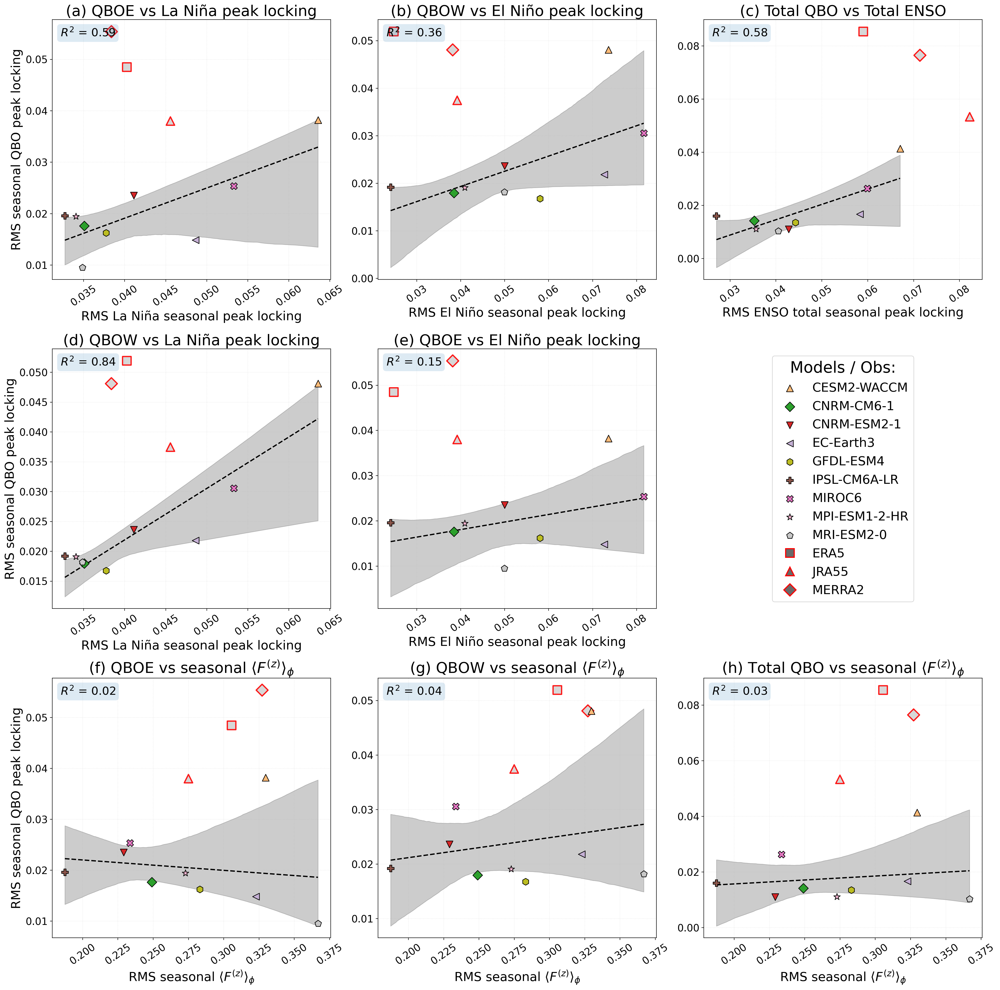

In [33]:
case_to_plot = "1sigma_15mo"
exclude_models = []

qboe_case = sensitivity_results[case_to_plot]["qboe_rms_prob"]
qbow_case = sensitivity_results[case_to_plot]["qbow_rms_prob"]
qbo_case  = sensitivity_results[case_to_plot]["qbo_rms_prob"]

OBS_SIZE = 180
OBS_ZORDER = 0
OBS_ALPHA = 0.9

# --- one figure: 2 rows x 3 cols ---
fig, axes = plt.subplots(3, 3, figsize=(22, 22), dpi=200, sharey=False)

handles, labels = [], []
# ============================================================
# Row 2: ENSO vs QBO (same as your second plot)
#   - keep your simple filter: only use EPF models
# ============================================================
models_enso = sorted(
    set(lanina_rms_prob) &
    set(elnino_rms_prob) &
    set(enso_rms_prob) &
    set(qboe_case) &
    set(qbow_case) &
    set(qbo_case)
)
models_enso = [m for m in models_enso if m not in exclude_models]
x1_all, y1_all = [], []
x2_all, y2_all = [], []
x3_all, y3_all = [], []

for name in models_enso:
    if name not in epf_rms:
        continue  # only keep EPF models

    if name in style_map:
        mk  = style_map[name]["marker"]
        col = style_map[name]["color"]
    else:
        mk, col = "o", "0.5"

    x1 = lanina_rms_prob[name]; y1 = qboe_case[name]
    x2 = elnino_rms_prob[name]; y2 = qbow_case[name]
    x3 = enso_rms_prob[name];   y3 = qbo_case[name]

    x1_all.append(x1); y1_all.append(y1)
    x2_all.append(x2); y2_all.append(y2)
    x3_all.append(x3); y3_all.append(y3)

    axes[0, 0].scatter(x1, y1, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[0, 1].scatter(x2, y2, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[0, 2].scatter(x3, y3, s=120, marker=mk, color=col, edgecolor="k", zorder=3)

    axes[1, 0].scatter(x1, y2, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[1, 1].scatter(x2, y1, s=120, marker=mk, color=col, edgecolor="k", zorder=3)

deg = 1
fit_and_plot_bootstrap(axes[0, 0], np.array(x1_all), np.array(y1_all), deg=deg)
fit_and_plot_bootstrap(axes[0, 1], np.array(x2_all), np.array(y2_all), deg=deg)
fit_and_plot_bootstrap(axes[0, 2], np.array(x3_all), np.array(y3_all), deg=deg)

fit_and_plot_bootstrap(axes[1, 0], np.array(x1_all), np.array(y2_all), deg=deg)
fit_and_plot_bootstrap(axes[1, 1], np.array(x2_all), np.array(y1_all), deg=deg)

# ============================================================
# Add observations to ENSO-vs-QBO panels only; not included in fit
# ============================================================

obs_names = ["ERA5", "JRA55", "MERRA2"]

for obs_name in obs_names:
    st = obs_styles[obs_name]

    # x-values: observational ENSO seasonal locking
    x1 = lanina_rms_prob_obs[obs_name]
    x2 = elnino_rms_prob_obs[obs_name]
    x3 = enso_rms_prob_obs[obs_name]

    # y-values: observational QBO seasonal locking
    y1 = qboe_rms_prob_obs[obs_name]
    y2 = qbow_rms_prob_obs[obs_name]
    y3 = qbo_rms_prob_obs[obs_name]

    # row 0: matched-sign panels
    axes[0, 0].scatter(x1, y1, s=OBS_SIZE, marker=st["marker"],
                   facecolor="lightgray", edgecolor=st["edgecolor"],
                   linewidth=2.0, alpha=OBS_ALPHA, zorder=OBS_ZORDER, label=obs_name)
    
    axes[0, 1].scatter(x2, y2, s=OBS_SIZE, marker=st["marker"],
                   facecolor="lightgray", edgecolor=st["edgecolor"],
                   linewidth=2.0, alpha=OBS_ALPHA, zorder=OBS_ZORDER)

    axes[0, 2].scatter(x3, y3, s=OBS_SIZE, marker=st["marker"],
                   facecolor="lightgray", edgecolor=st["edgecolor"],
                   linewidth=2.0, alpha=OBS_ALPHA, zorder=OBS_ZORDER)
    
    axes[1, 0].scatter(x1, y2, s=OBS_SIZE, marker=st["marker"],
                   facecolor="lightgray", edgecolor=st["edgecolor"],
                   linewidth=2.0, alpha=OBS_ALPHA, zorder=OBS_ZORDER)
    
    axes[1, 1].scatter(x2, y1, s=OBS_SIZE, marker=st["marker"],
                   facecolor="lightgray", edgecolor=st["edgecolor"],
                   linewidth=2.0, alpha=OBS_ALPHA, zorder=OBS_ZORDER)

titles_row2 = ["(a) QBOE vs La Niña peak locking", "(b) QBOW vs El Niño peak locking", "(c) Total QBO vs Total ENSO"]
titles_row3 = ["(d) QBOW vs La Niña peak locking", "(e) QBOE vs El Niño peak locking"]

xlabels_row2 = ["RMS La Niña seasonal peak locking",
                "RMS El Niño seasonal peak locking",
                "RMS ENSO total seasonal peak locking"]

for ax, title, xl in zip(axes[0, :], titles_row2, xlabels_row2):
    ax.set_title(title, fontsize=24)
    ax.set_xlabel(xl, fontsize=20)
    ax.grid(alpha=0.3, linestyle=":")
    ax.tick_params(axis="both", labelsize=16)
    ax.tick_params(axis="x", labelrotation=35)
    #ax.set_ylim(2, 22)
    #ax.label_outer()

for ax, title, xl in zip(axes[1, :], titles_row3, xlabels_row2):
    ax.set_title(title, fontsize=24)
    ax.set_xlabel(xl, fontsize=20)
    ax.grid(alpha=0.3, linestyle=":")
    ax.tick_params(axis="both", labelsize=16)
    ax.tick_params(axis="x", labelrotation=35)

axes[0, 0].set_ylabel("RMS seasonal QBO peak locking", fontsize=20)
axes[1, 0].set_ylabel("RMS seasonal QBO peak locking", fontsize=20)

# ============================================================
# Row 2: EPF vs QBO (same as your first plot)
# ============================================================
models_epf = sorted(set(epf_rms) & set(qboe_case) & set(qbow_case) & set(qbo_case))
models_epf = [m for m in models_epf if m not in exclude_models]
x_all, y_e_all, y_w_all, y_t_all = [], [], [], []

for name in models_epf:
    if name in style_map:
        mk  = style_map[name]["marker"]
        col = style_map[name]["color"]
    else:
        mk, col = "o", "0.5"

    x  = epf_rms[name]
    yE = qboe_case[name]
    yW = qbow_case[name]
    yT = qbo_case[name]

    x_all.append(x);  y_e_all.append(yE);  y_w_all.append(yW);  y_t_all.append(yT)

    h = axes[2, 0].scatter(x, yE, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[2, 1].scatter(x, yW, s=120, marker=mk, color=col, edgecolor="k", zorder=3)
    axes[2, 2].scatter(x, yT, s=120, marker=mk, color=col, edgecolor="k", zorder=3)

    handles.append(h)
    labels.append(name)

deg = 1
X  = np.array(x_all, dtype=float)
YE = np.array(y_e_all, dtype=float)
YW = np.array(y_w_all, dtype=float)
YT = np.array(y_t_all, dtype=float)

fit_and_plot_bootstrap(axes[2, 0], X, YE, deg=deg)
fit_and_plot_bootstrap(axes[2, 1], X, YW, deg=deg)
fit_and_plot_bootstrap(axes[2, 2], X, YT, deg=deg)

for obs_name in obs_names:
    st = obs_styles[obs_name]

    x = epf_rms_obs[obs_name]
    yE = qboe_rms_prob_obs[obs_name]
    yW = qbow_rms_prob_obs[obs_name]
    yT = qbo_rms_prob_obs[obs_name]

    axes[2, 0].scatter(x, yE, s=OBS_SIZE, marker=st["marker"],
                       facecolor="lightgray", edgecolor=st["edgecolor"],
                       linewidth=2.0, alpha=OBS_ALPHA, zorder=OBS_ZORDER)
    
    axes[2, 1].scatter(x, yW, s=OBS_SIZE, marker=st["marker"],
                       facecolor="lightgray", edgecolor=st["edgecolor"],
                       linewidth=2.0, alpha=OBS_ALPHA, zorder=OBS_ZORDER)
    
    axes[2, 2].scatter(x, yT, s=OBS_SIZE, marker=st["marker"],
                       facecolor="lightgray", edgecolor=st["edgecolor"],
                       linewidth=2.0, alpha=OBS_ALPHA, zorder=OBS_ZORDER)

titles_row1 = [r"(f) QBOE vs seasonal $\langle F^{(z)} \rangle_\phi$", 
               r"(g) QBOW vs seasonal $\langle F^{(z)} \rangle_\phi$", 
               r"(h) Total QBO vs seasonal $\langle F^{(z)} \rangle_\phi$"]
for ax, title in zip(axes[2, :], titles_row1):
    ax.set_title(title, fontsize=24)
    ax.set_xlabel(r"RMS seasonal $\langle F^{(z)} \rangle_\phi$", fontsize=20)
    ax.grid(alpha=0.3, linestyle=":")
    ax.tick_params(axis="both", labelsize=16)
    ax.tick_params(axis="x", labelrotation=35)
    #ax.set_ylim(1, 22)

axes[2, 0].set_ylabel("RMS seasonal QBO peak locking", fontsize=20)

# Remove duplicate panel (f)
axes[1, 2].axis("off")

# Deduplicate legend entries
uniq = {}
for h, lab in zip(handles, labels):
    if lab not in uniq:
        uniq[lab] = h
for obs_name in obs_names:
    st = obs_styles[obs_name]

    h = plt.Line2D(
        [],
        [],
        marker=st["marker"],
        linestyle="None",
        markersize=14,
        markerfacecolor=st["facecolor"],
        markeredgecolor=st["edgecolor"],
        markeredgewidth=1.8,
        label=obs_name,
    )

    uniq[obs_name] = h
# Put legend in panel (f)
axes[1, 2].legend(
    uniq.values(),
    uniq.keys(),
    loc="center",
    fontsize=20,
    frameon=True,
    title="Models / Obs:",
    title_fontsize=25,
    ncol=1,
)

plt.tight_layout()
plt.savefig("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/figure3_threshold_all-with-obs.pdf",
            format="pdf", bbox_inches="tight")
plt.show()

# Figure 4: Strength of ENSO's seasonal cycle vs strength of QBO's

In [34]:
# ------------------ Settings ------------------
NPZ_DIR = "/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/bootstrap_results_5ms"
OUTFIG  = "/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/figure4_all.pdf"

# ------------------ load bootstrap npz results ------------------
files = sorted(glob.glob(os.path.join(NPZ_DIR, "*_qbo_enso_bootstrap_*.npz")))
if not files:
    raise RuntimeError(f"No .npz files found in {NPZ_DIR}")

bootstrap_results = {}
for f in files:
    d = np.load(f, allow_pickle=True)
    model = str(d["model"])
    bootstrap_results[model] = {
        "mean_elnino": np.asarray(d["mean_elnino"]),
        "mean_lanina": np.asarray(d["mean_lanina"]),
        "mean_qbow":   np.asarray(d["mean_qbow"]),
        "mean_qboe":   np.asarray(d["mean_qboe"]),
        "enso_threshold": float(d["enso_threshold"]) if "enso_threshold" in d else np.nan,
        "qbo_threshold": float(d["qbo_threshold"]) if "qbo_threshold" in d else np.nan,
    }

models = sorted(bootstrap_results.keys())
if not models:
    raise RuntimeError("No models loaded from NPZ files.")

# ------------------ RMS computation (RMS across the 12 monthly means) ------------------
def rms_of_series(arr):
    arr = np.asarray(arr, dtype=float)
    if not np.isfinite(arr).any():
        return np.nan
    return float(np.sqrt(np.nanmean(arr**2)))

rms_elnino = {m: rms_of_series(bootstrap_results[m]["mean_elnino"]) for m in models}
rms_lanina = {m: rms_of_series(bootstrap_results[m]["mean_lanina"]) for m in models}
rms_qbow   = {m: rms_of_series(bootstrap_results[m]["mean_qbow"])   for m in models}
rms_qboe   = {m: rms_of_series(bootstrap_results[m]["mean_qboe"])   for m in models}

# ------------------ choose models present in each panel ------------------
models_p1 = [m for m in models if np.isfinite(rms_elnino[m]) and np.isfinite(rms_qbow[m])]
models_p2 = [m for m in models if np.isfinite(rms_lanina[m]) and np.isfinite(rms_qboe[m])]
models_all = sorted(set(models_p1) | set(models_p2))

# ------------------ style helper ------------------
def get_style(m):
    if m in style_map:
        return style_map[m]["marker"], style_map[m]["color"]
    markers = ["o", "s", "D", "^", "v", "P", "X", "*", "h"]
    cmap = plt.get_cmap("tab10")
    i = abs(hash(m)) % 10
    return markers[i % len(markers)], cmap(i)

In [35]:
with open("obs_qbo_enso.pkl", "rb") as f:
    obs_data = pickle.load(f)

def rms(x):
    return np.sqrt(np.mean(np.asarray(x)**2))

obs_rms = {
    "ERA5": {
        "elnino": rms(obs_data["ERA5"]["mean_elnino"]),
        "lanina": rms(obs_data["ERA5"]["mean_lanina"]),
        "qboe": rms(obs_data["ERA5"]["mean_qboe"]),
        "qbow": rms(obs_data["ERA5"]["mean_qbow"]),
    },
    "JRA55": {
        "elnino": rms(obs_data["JRA55"]["mean_elnino"]),
        "lanina": rms(obs_data["JRA55"]["mean_lanina"]),
        "qboe": rms(obs_data["JRA55"]["mean_qboe"]),
        "qbow": rms(obs_data["JRA55"]["mean_qbow"]),
    },
    "MERRA2": {
        "elnino": rms(obs_data["MERRA2"]["mean_elnino"]),
        "lanina": rms(obs_data["MERRA2"]["mean_lanina"]),
        "qboe": rms(obs_data["MERRA2"]["mean_qboe"]),
        "qbow": rms(obs_data["MERRA2"]["mean_qbow"]),
    }
}

In [36]:
def fit_and_plot_bootstrap(ax, x, y, deg=1, nboot=5000, ci=95,
                           show_r2_ci=False,
                           line_kw=None, fill_kw=None, text_kw=None):
    """
    Fit polynomial of degree `deg`, plot best-fit line + bootstrap CI band,
    and annotate R^2 (optionally with bootstrap CI for R^2).

    Bootstrap resamples (x_i, y_i) pairs.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    m = np.isfinite(x) & np.isfinite(y)
    x = x[m]; y = y[m]
    if len(x) < deg + 1:
        return np.nan

    # ----- best fit -----
    coeff = np.polyfit(x, y, deg=deg)
    p = np.poly1d(coeff)

    xs = np.linspace(x.min(), x.max(), 200)
    ys = p(xs)

    if line_kw is None:
        line_kw = dict(linewidth=2, zorder=2, color="k", linestyle="dashed")
    ax.plot(xs, ys, **line_kw)

    # R^2 on original data
    yhat = p(x)
    ss_res = np.sum((y - yhat)**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

    # ----- bootstrap band -----
    n = len(x)
    y_boot = np.empty((nboot, xs.size))
    r2_boot = np.empty(nboot) if show_r2_ci else None

    for i in range(nboot):
        idx = np.random.randint(0, n, n)  # resample pairs
        xb = x[idx]; yb = y[idx]

        cb = np.polyfit(xb, yb, deg=deg)
        pb = np.poly1d(cb)

        y_boot[i, :] = pb(xs)

        if show_r2_ci:
            yb_hat = pb(xb)
            ss_res_b = np.sum((yb - yb_hat)**2)
            ss_tot_b = np.sum((yb - np.mean(yb))**2)
            r2_boot[i] = 1 - ss_res_b / ss_tot_b if ss_tot_b > 0 else np.nan

    alpha = (100 - ci) / 2
    lo = np.nanpercentile(y_boot, alpha, axis=0)
    hi = np.nanpercentile(y_boot, 100 - alpha, axis=0)

    if fill_kw is None:
        fill_kw = dict(color="k", alpha=0.20, zorder=1)
    ax.fill_between(xs, lo, hi, **fill_kw)

    # ----- annotate -----
    if text_kw is None:
        text_kw = dict(fontsize=18,
                       bbox=dict(boxstyle="round", alpha=0.15, edgecolor="none"))

    if show_r2_ci and r2_boot is not None:
        r2_lo = np.nanpercentile(r2_boot, alpha)
        r2_hi = np.nanpercentile(r2_boot, 100 - alpha)
        txt = rf"$R^2$ = {r2:.2f}" + "\n" + rf"{ci:.0f}% CI [{r2_lo:.2f}, {r2_hi:.2f}]"
    else:
        txt = rf"$R^2$ = {r2:.2f}"

    ax.text(0.03, 0.97, txt, transform=ax.transAxes,
            va="top", ha="left", **text_kw)

    return r2

In [37]:
fig3_models = sorted(
    set(lanina_rms_prob)
    & set(elnino_rms_prob)
    & set(enso_rms_prob)
    & set(qboe_rms_prob)
    & set(qbow_rms_prob)
    & set(qbo_rms_prob)
    & set(epf_rms)
)

print(fig3_models)
print(len(fig3_models))

# models_p1 = [m for m in models_p1 if m in fig3_models]
# models_p2 = [m for m in models_p2 if m in fig3_models]

exclude_models = ["GFDL-ESM4"]
models_p1 = [m for m in models_p1 if m not in exclude_models]
models_p2 = [m for m in models_p2 if m not in exclude_models]

['CESM2-WACCM', 'CNRM-CM6-1', 'CNRM-ESM2-1', 'EC-Earth3', 'GFDL-ESM4', 'IPSL-CM6A-LR', 'MIROC6', 'MPI-ESM1-2-HR', 'MRI-ESM2-0']
9


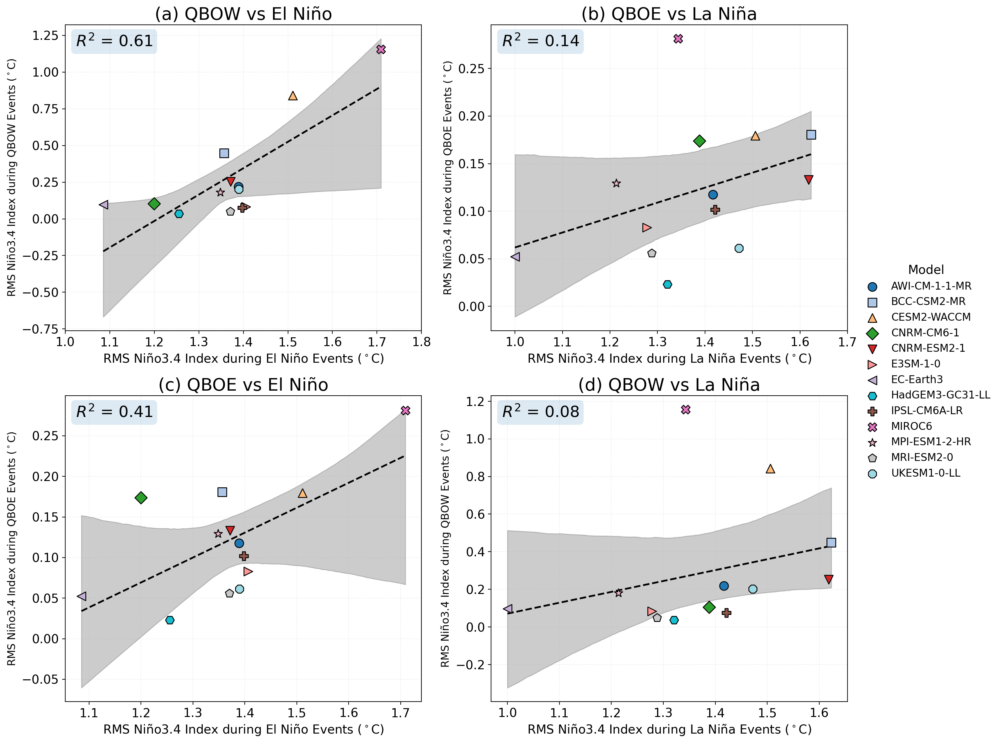

Saved: /glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/figure4_all.pdf


In [38]:
# ------------------ plotting (reuse visual style from your example) ------------------
plt.rcParams.update({"font.size": 12})
fig, axes = plt.subplots(
    2, 2,
    figsize=(16, 12),
    dpi=200,
    sharex=False,
    sharey=False
)

ax1, ax2 = axes[0]
ax3, ax4 = axes[1]

handles = []
labels = []

# panel 1: El Niño RMS vs QBOW RMS 
for name in models_p1:
    mk, col = get_style(name)
    x = rms_elnino[name]
    y = rms_qbow[name] 
    h = ax1.scatter(x, y, s=100, marker=mk, color=col, edgecolor="k", zorder=3)
    if name not in labels:
        handles.append(h); labels.append(name)

# panel 2: La Niña RMS vs QBOE RMS 
for name in models_p2:
    mk, col = get_style(name)
    x = rms_lanina[name]
    y = rms_qboe[name] 
    ax2.scatter(x, y, s=100, marker=mk, color=col, edgecolor="k", zorder=3)

fit_and_plot_bootstrap(ax1, [rms_elnino[m] for m in models_p1], [rms_qbow[m] for m in models_p1], deg=1)
fit_and_plot_bootstrap(ax2, [rms_lanina[m] for m in models_p2], [rms_qboe[m] for m in models_p2], deg=1)

# panel 3: El Niño RMS vs QBOE RMS
for name in models_p1:
    mk, col = get_style(name)
    ax3.scatter(rms_elnino[name], rms_qboe[name], s=100, marker=mk, color=col, edgecolor="k", zorder=3)

fit_and_plot_bootstrap(ax3, [rms_elnino[m] for m in models_p1], [rms_qboe[m] for m in models_p1], deg=1)

# panel 4: La Niña RMS vs QBOW RMS
for name in models_p2:
    mk, col = get_style(name)
    ax4.scatter(rms_lanina[name], rms_qbow[name], s=100, marker=mk, color=col, edgecolor="k", zorder=3)

fit_and_plot_bootstrap(ax4, [rms_lanina[m] for m in models_p2], [rms_qbow[m] for m in models_p2], deg=1)

# titles / labels / grid / ticks
ax1.set_title("(a) QBOW vs El Niño", fontsize=20)
ax2.set_title("(b) QBOE vs La Niña", fontsize=20)
ax3.set_title("(c) QBOE vs El Niño", fontsize=20)
ax4.set_title("(d) QBOW vs La Niña", fontsize=20)

ax1.set_xlabel(r"RMS Niño3.4 Index during El Niño Events ($^\circ$C)", fontsize=14)
ax3.set_xlabel(r"RMS Niño3.4 Index during El Niño Events ($^\circ$C)", fontsize=14)
ax2.set_xlabel(r"RMS Niño3.4 Index during La Niña Events ($^\circ$C)", fontsize=14)
ax4.set_xlabel(r"RMS Niño3.4 Index during La Niña Events ($^\circ$C)", fontsize=14)

ax1.set_ylabel(r"RMS Niño3.4 Index during QBOW Events ($^\circ$C)")
ax2.set_ylabel(r"RMS Niño3.4 Index during QBOE Events ($^\circ$C)")
ax3.set_ylabel(r"RMS Niño3.4 Index during QBOE Events ($^\circ$C)")
ax4.set_ylabel(r"RMS Niño3.4 Index during QBOW Events ($^\circ$C)")

ax1.grid(alpha=0.3, linestyle=":")
ax2.grid(alpha=0.3, linestyle=":")
ax3.grid(alpha=0.3, linestyle=":")
ax4.grid(alpha=0.3, linestyle=":")
ax1.tick_params(axis="both", labelsize=14)
ax2.tick_params(axis="both", labelsize=14)
ax3.tick_params(axis="both", labelsize=14)
ax4.tick_params(axis="both", labelsize=14)

ax1.set_xlim(1, 1.8)
ax2.set_xlim(0.95, 1.7)

obs_marker = "*"
obs_color = "black"
obs_size = 260

# legend on right (vertical)
uniq = {}
for h, lab in zip(handles, labels):
    if lab not in uniq:
        uniq[lab] = h
fig.legend(list(uniq.values()), list(uniq.keys()), loc="center right", fontsize=12, frameon=False, title="Model", title_fontsize=14)

plt.tight_layout(rect=[0, 0, 0.87, 1.0])
os.makedirs(os.path.dirname(OUTFIG), exist_ok=True)
fig.savefig(OUTFIG, bbox_inches="tight", format="pdf")
plt.show()
print("Saved:", OUTFIG)

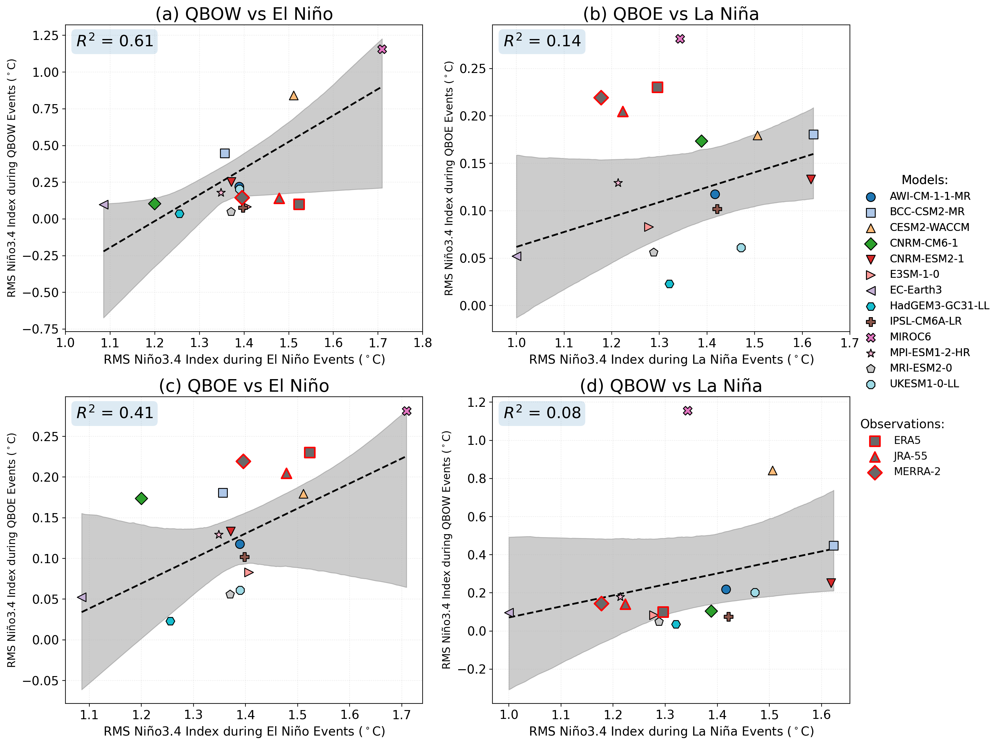

Saved: /glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/figure4_all-with-obs.pdf


In [39]:
OUTFIG2  = "/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/figure4_all-with-obs.pdf"

plt.rcParams.update({"font.size": 12})
fig, axes = plt.subplots(
    2, 2,
    figsize=(16, 12),
    dpi=200,
    sharex=False,
    sharey=False
)

ax1, ax2 = axes[0]
ax3, ax4 = axes[1]

handles = []
labels = []

# panel 1: El Niño RMS vs QBOW RMS 
for name in models_p1:
    mk, col = get_style(name)
    x = rms_elnino[name]
    y = rms_qbow[name] 
    h = ax1.scatter(x, y, s=100, marker=mk, color=col, edgecolor="k", zorder=3)
    if name not in labels:
        handles.append(h); labels.append(name)

# panel 2: La Niña RMS vs QBOE RMS 
for name in models_p2:
    mk, col = get_style(name)
    x = rms_lanina[name]
    y = rms_qboe[name] 
    ax2.scatter(x, y, s=100, marker=mk, color=col, edgecolor="k", zorder=3)

fit_and_plot_bootstrap(ax1, [rms_elnino[m] for m in models_p1], [rms_qbow[m] for m in models_p1], deg=1)
fit_and_plot_bootstrap(ax2, [rms_lanina[m] for m in models_p2], [rms_qboe[m] for m in models_p2], deg=1)

# panel 3: El Niño RMS vs QBOE RMS
for name in models_p1:
    mk, col = get_style(name)
    ax3.scatter(rms_elnino[name], rms_qboe[name], s=100, marker=mk, color=col, edgecolor="k", zorder=3)

fit_and_plot_bootstrap(ax3, [rms_elnino[m] for m in models_p1], [rms_qboe[m] for m in models_p1], deg=1)

# panel 4: La Niña RMS vs QBOW RMS
for name in models_p2:
    mk, col = get_style(name)
    ax4.scatter(rms_lanina[name], rms_qbow[name], s=100, marker=mk, color=col, edgecolor="k", zorder=3)

fit_and_plot_bootstrap(ax4, [rms_lanina[m] for m in models_p2], [rms_qbow[m] for m in models_p2], deg=1)

# titles / labels / grid / ticks
ax1.set_title("(a) QBOW vs El Niño", fontsize=20)
ax2.set_title("(b) QBOE vs La Niña", fontsize=20)
ax3.set_title("(c) QBOE vs El Niño", fontsize=20)
ax4.set_title("(d) QBOW vs La Niña", fontsize=20)

ax1.set_xlabel(r"RMS Niño3.4 Index during El Niño Events ($^\circ$C)", fontsize=14)
ax3.set_xlabel(r"RMS Niño3.4 Index during El Niño Events ($^\circ$C)", fontsize=14)
ax2.set_xlabel(r"RMS Niño3.4 Index during La Niña Events ($^\circ$C)", fontsize=14)
ax4.set_xlabel(r"RMS Niño3.4 Index during La Niña Events ($^\circ$C)", fontsize=14)

ax1.set_ylabel(r"RMS Niño3.4 Index during QBOW Events ($^\circ$C)")
ax2.set_ylabel(r"RMS Niño3.4 Index during QBOE Events ($^\circ$C)")
ax3.set_ylabel(r"RMS Niño3.4 Index during QBOE Events ($^\circ$C)")
ax4.set_ylabel(r"RMS Niño3.4 Index during QBOW Events ($^\circ$C)")

ax1.grid(alpha=0.3, linestyle=":")
ax2.grid(alpha=0.3, linestyle=":")
ax3.grid(alpha=0.3, linestyle=":")
ax4.grid(alpha=0.3, linestyle=":")
ax1.tick_params(axis="both", labelsize=14)
ax2.tick_params(axis="both", labelsize=14)
ax3.tick_params(axis="both", labelsize=14)
ax4.tick_params(axis="both", labelsize=14)

ax1.set_xlim(1, 1.8)
ax2.set_xlim(0.95, 1.7)

obs_handles = []
obs_labels = []

for obs_name, vals in obs_rms.items():
    st = obs_styles[obs_name]
    mk = st["marker"]
    lab = st["label"]

    scatter_kwargs = dict(
        s=130,
        marker=mk,
        facecolors=st["facecolor"],
        edgecolors=st["edgecolor"],
        linewidths=1.8,
        zorder=12,
    )

    h = ax1.scatter(vals["elnino"], vals["qbow"], **scatter_kwargs)
    ax2.scatter(vals["lanina"], vals["qboe"], **scatter_kwargs)
    ax3.scatter(vals["elnino"], vals["qboe"], **scatter_kwargs)
    ax4.scatter(vals["lanina"], vals["qbow"], **scatter_kwargs)

    obs_handles.append(h)
    obs_labels.append(lab)
# legend on right (vertical)
uniq = {}
for h, lab in zip(handles, labels):
    if lab not in uniq:
        uniq[lab] = h

model_legend = fig.legend(
    list(uniq.values()),
    list(uniq.keys()),
    loc="center left",
    bbox_to_anchor=(0.85, 0.62),
    title="Models:",
    fontsize=12,
    title_fontsize=14,
    frameon=False,
)

obs_legend = fig.legend(
    obs_handles,
    obs_labels,
    loc="center left",
    bbox_to_anchor=(0.85, 0.4),
    title="Observations:",
    fontsize=12,
    title_fontsize=14,
    frameon=False,
)

fig.add_artist(model_legend)

plt.tight_layout(rect=[0, 0, 0.87, 1.0])
os.makedirs(os.path.dirname(OUTFIG2), exist_ok=True)
fig.savefig(OUTFIG2, bbox_inches="tight", format="pdf")
plt.show()
print("Saved:", OUTFIG2)

# Supplementary Figure 1: Seasonal EP Flux

In [40]:
import math

In [46]:
P_MIN_HPA = 500
P_MAX_HPA = 70

plev_maxvar = {}
rms_at_maxvar = {}

for name, da0 in EP_fluxes.items():
    # ensure shape (plev, month) and plev in Pa
    da = da0.transpose("plev", "month")
    p_hPa = da["plev"] / 100.0

    # restrict search band
    band = da.where((p_hPa <= P_MIN_HPA) & (p_hPa >= P_MAX_HPA), drop=True)

    # max variance across month at each plev
    var_by_plev = band.var("month", skipna=True)          # (plev)
    p_star = float(var_by_plev.idxmax("plev").values)     # Pa

    plev_maxvar[name] = p_star

    # RMS across months at that pressure
    da_p = da.sel(plev=p_star, method="nearest")          # (month)
    rms = float(np.sqrt((da_p**2).mean("month", skipna=True)).values)
    rms_at_maxvar[name] = rms

print("Computed max-variance pressure + RMS for", len(plev_maxvar), "models.")

Computed max-variance pressure + RMS for 9 models.


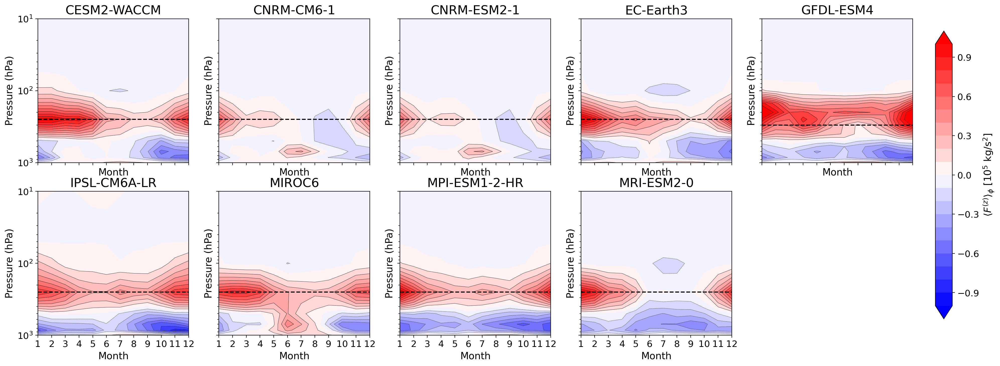

In [47]:
model_order = list(model_names_Fz) 
# model_order = sorted(EP_fluxes.keys())  # alternative

# symmetric color scale across all models
all_abs = np.concatenate([np.abs(EP_fluxes[n].values).ravel() for n in model_order])
vmax = np.nanpercentile(all_abs, 99)
levels = np.linspace(-1, 1, 21) #/ 10**5

n_models = len(model_order)
ncols = 5
nrows = math.ceil(n_models / ncols)

plt.rcParams.update({"font.size": 13})

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(4.5*ncols, 4.1*nrows),
    dpi=200,
    sharex=True,
    sharey=True
)
axes = axes.flatten()

for i, name in enumerate(model_order):
    ax = axes[i]

    da = EP_fluxes[name].transpose("plev", "month")  # (plev, month)
    p_hPa = (da["plev"] / 100.0).values
    pos_levels = [lev for lev in levels if lev >= 0]
    neg_levels = [lev for lev in levels if lev < 0]
    ax.contour(da["month"].values, p_hPa, da.values / 10**5, levels=levels[levels != 0], colors="k", linewidths=0.3)
    cf = ax.contourf(
        da["month"].values,
        p_hPa,
        da.values / 10**5,
        levels=levels,
        cmap="bwr",
        extend="both",
    )

    # dashed line at max-variance pressure
    p_star_hPa = plev_maxvar[name] / 100.0
    ax.axhline(p_star_hPa, linestyle="--", linewidth=1.5, color="k")

    # title with diagnostics
    ax.set_title(f"{name}", fontsize=18)

    ax.set_yscale("log")
    ax.invert_yaxis()
    ax.set_ylim(1000, 10)
    ax.set_xticks(np.arange(1, 13))

# delete unused axes
for j in range(n_models, len(axes)):
    fig.delaxes(axes[j])

# colorbar on right
fig.subplots_adjust(right=0.90)
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cbar = fig.colorbar(cf, cax=cbar_ax)
cbar.set_label(r"$\langle F^{(z)} \rangle_{\phi}$ [10$^5$ kg/s$^2$]", fontsize=14)

# labels
for ax in axes[:n_models]:
    ax.set_xlabel("Month", fontsize=14)
    ax.set_ylabel("Pressure (hPa)", fontsize=14)
plt.savefig("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/sm_epf_models.pdf", format="pdf",bbox_inches = "tight")
plt.show()

# Supplementary Figure 2: Binned by ENSO EP Flux

In [42]:
with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/flux_binned_by_model_epf_corrected.pkl", "rb") as f:
    flux_binned_by_model = pickle.load(f)
    
with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/nino34_cmip.pkl", "rb") as f:
    nino34_data = pickle.load(f)

In [43]:
# Precompute everything needed for plotting

plot_data = {}

for name, fb in flux_binned_by_model.items():
    print("precomputing:", name)
    centers = fb.nino34_bins.to_index().mid.values
    plevs_hPa = (fb.plev / 100.0).values
    Z = fb.transpose("plev", "nino34_bins").values

    plot_data[name] = {
        "centers": centers,
        "plevs_hPa": plevs_hPa,
        "Z": Z,
    }


precomputing: CESM2-WACCM
precomputing: MIROC6
precomputing: CNRM-ESM2-1
precomputing: CNRM-CM6-1
precomputing: MRI-ESM2-0
precomputing: GFDL-ESM4
precomputing: EC-Earth3
precomputing: MPI-ESM1-2-HR
precomputing: IPSL-CM6A-LR


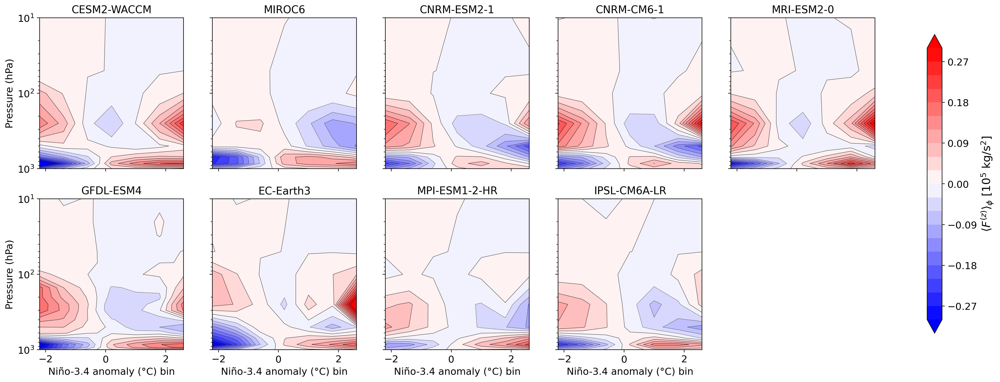

In [44]:
n_models = len(plot_data)
ncols = 5
nrows = int(np.ceil(n_models / ncols))

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(5 * ncols, 4 * nrows),
    sharex=True, sharey=True, dpi=200
)
axes = np.atleast_1d(axes).ravel()

levels = np.linspace(-0.3, 0.3, 21)

cf = None
for i, (ax, (name, data)) in enumerate(zip(axes, plot_data.items())):
    centers = data["centers"]
    plevs_hPa = data["plevs_hPa"]
    Z = data["Z"] / 10**5

    # Filled contours
    cf = ax.contourf(
        centers, plevs_hPa, Z,
        levels=levels, cmap="bwr", extend="both"
    )

    # ---- Black contour lines ----
    # Positive: solid
    pos_levels = [lev for lev in levels if lev >= 0]
    if pos_levels:
        ax.contour(
            centers, plevs_hPa, Z,
            levels=pos_levels, colors="k",
            linewidths=0.35, linestyles="solid"
        )

    # Negative: dashed
    neg_levels = [lev for lev in levels if lev < 0]
    if neg_levels:
        ax.contour(
            centers, plevs_hPa, Z,
            levels=neg_levels, colors="k",
            linewidths=0.35, linestyles="dashed"
        )
    # -----------------------------

    ax.set_yscale("log")
    ax.set_ylim(1000, 10)
    ax.set_title(name, fontsize=14)

    row = i // ncols
    col = i % ncols
    if col == 0:
        ax.set_ylabel("Pressure (hPa)")
    if row == nrows - 1:
        ax.set_xlabel("Niño-3.4 anomaly (°C) bin")

# Hide unused axes
for ax in axes[n_models:]:
    ax.set_visible(False)

cbar = fig.colorbar(
    cf,
    ax=axes[:n_models],
    shrink=0.9
)

cbar.set_label(
    r"$\langle F^{(z)} \rangle_{\phi}$ [10$^5$ kg/s$^2$]",
    fontsize=15
)
#fig.suptitle("Vertical Eddy Momentum Flux binned by Niño3.4", y=0.98)
plt.savefig("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/sm_epf_enso_allmodels.pdf", format="pdf",bbox_inches = "tight")

plt.show()

# Supplementary Figure 3: QBO peaks for every model

In [67]:
def bootstrap_ci_from_counts(counts, nboot=5000, seed=0):
    """
    counts: (12,) monthly peak counts
    Returns:
      prob = counts / total peaks
      ci   = percentile CI for monthly peak probability
    """
    rng = np.random.default_rng(seed)
    counts = np.asarray(counts, dtype=int)

    n_peaks = counts.sum()
    if n_peaks == 0:
        prob = np.full(12, np.nan)
        ci = np.full((2, 12), np.nan)
        return prob, ci

    p = counts / n_peaks

    boot = rng.multinomial(n_peaks, p, size=nboot) / n_peaks
    ci = np.percentile(boot, [2.5, 97.5], axis=0)

    return p, ci

def ci_to_yerr(prob, ci):
    low = np.clip(prob - ci[0], 0, None)
    high = np.clip(ci[1] - prob, 0, None)
    return np.vstack([low, high])

In [68]:
plt.rcParams.update({
    "font.size": 18,
    "axes.titlesize": 26,
    "axes.labelsize": 22,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
    "legend.fontsize": 20
})

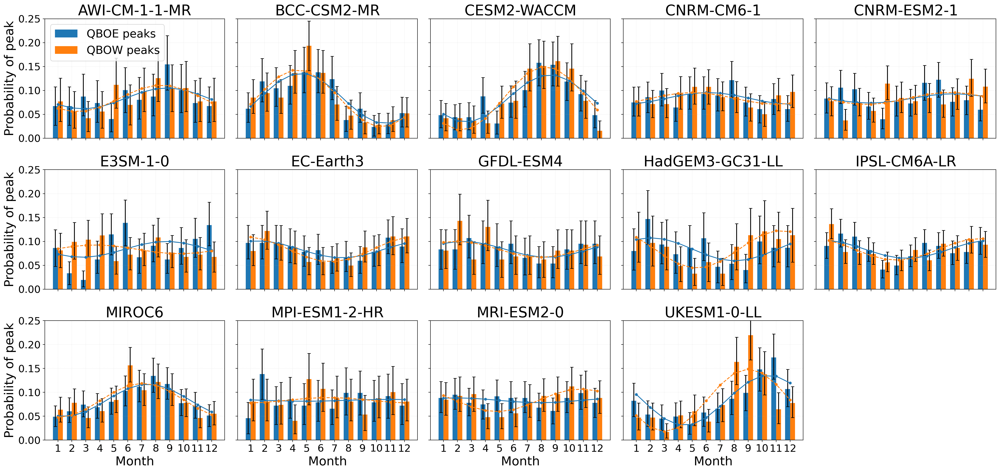

In [69]:
n_models = len(results)
ncols = 5
nrows = int(np.ceil(n_models / ncols))

fig, axes = plt.subplots(
    nrows, ncols, figsize=(5*ncols, 4*nrows),
    sharex=True, sharey=True, dpi=200
)

axes = np.atleast_1d(axes).ravel()
months = np.arange(1, 13)
width = 0.35

for i, (ax, (name, (east_counts, west_counts))) in enumerate(zip(axes, results.items())):
    row = i // ncols
    col = i % ncols
    n = nyears[name]

    east_prob, east_ci = bootstrap_ci_from_counts(east_counts, seed=100+i)
    west_prob, west_ci = bootstrap_ci_from_counts(west_counts, seed=200+i)
    
    east_yerr = ci_to_yerr(east_prob, east_ci)
    west_yerr = ci_to_yerr(west_prob, west_ci)
    
    ax.bar(months - width/2, east_prob, width, yerr=east_yerr,
           capsize=3, ecolor="black", label="QBOE peaks")
    ax.bar(months + width/2, west_prob, width, yerr=west_yerr,
           capsize=3, ecolor="black", label="QBOW peaks")

    fr = fit_results_prob[name]
    ax.plot(months, fr["east"]["fit_curve"], "-o", ms=4)
    ax.plot(months, fr["west"]["fit_curve"], "--o", ms=4)

    ax.set_title(name)
    ax.set_xticks(months)
    ax.tick_params(axis="both")
    ax.set_ylim(0,0.25)
    ax.set_yticks(np.arange(0,0.251, 0.05))
    ax.grid(alpha=0.3, linestyle=":")
    

    if col == 0:
        ax.set_ylabel("Probability of peak")
    if row == nrows - 1:
        ax.set_xlabel("Month")

axes[0].legend(loc="upper left")

for ax in axes[n_models:]:
    ax.set_visible(False)

fig.tight_layout()
plt.savefig("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/sm_qbo_seasonality_models.pdf", format="pdf",bbox_inches = "tight")

plt.show()

# Supplementary Figure 4: ENSO peaks for every model

In [70]:
with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/nino34_cmip.pkl", "rb") as f:
    nino34_data = pickle.load(f)

In [71]:
def fit_annual_sine(months, y):
    """Fit y(m) with a single annual harmonic and return amplitude & phase."""
    months = np.asarray(months, float)
    y = np.asarray(y, float)

    omega = 2 * np.pi / 12.0  # annual cycle

    X = np.column_stack([
        np.sin(omega * months),
        np.cos(omega * months),
        np.ones_like(months)
    ])

    (a, b, c), *_ = np.linalg.lstsq(X, y, rcond=None)

    A = np.hypot(a, b)
    phi = np.arctan2(b, a)

    m_peak = (0.5 * np.pi - phi) / omega  # month of maximum

    y_fit = A * np.sin(omega * months + phi) + c

    return A, phi, c, m_peak, y_fit

In [72]:
months = np.arange(1, 13)

enso_fit_results_prob = {}

for name in nino34_data.keys():

    en_counts = el_nino_counts_by_model[name]
    ln_counts = la_nina_counts_by_model[name]
    en_prob = en_counts / en_counts.sum()
    ln_prob = ln_counts / ln_counts.sum()
    
    A_en, phi_en, c_en, mpeak_en, yfit_en = fit_annual_sine(months, en_prob)
    A_ln, phi_ln, c_ln, mpeak_ln, yfit_ln = fit_annual_sine(months, ln_prob)

    enso_fit_results_prob[name] = {
        "el_nino": {
            "A": A_en,
            "phi": phi_en,
            "offset": c_en,
            "peak_month": (mpeak_en - 1) % 12 + 1,
            "fit_curve": yfit_en,
        },
        "la_nina": {
            "A": A_ln,
            "phi": phi_ln,
            "offset": c_ln,
            "peak_month": (mpeak_ln - 1) % 12 + 1,
            "fit_curve": yfit_ln,
        },
    }

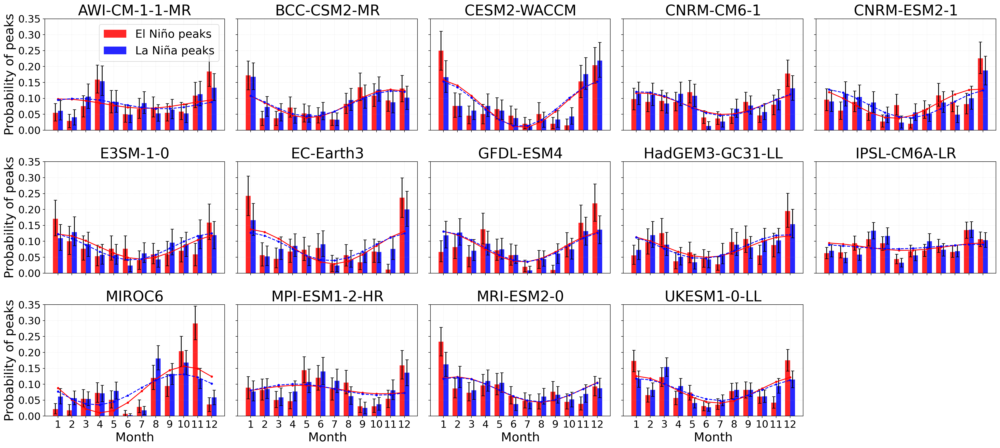

In [73]:
n_models = len(enso_fit_results_prob)
ncols = 5
nrows = int(np.ceil(n_models / ncols))

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(5*ncols, 3.8*nrows),
    sharex=True, sharey=True,
    dpi=200
)

axes = np.atleast_1d(axes).ravel()
width = 0.35
months = np.arange(1, 13)

for i, (ax, (name, fr)) in enumerate(zip(axes, enso_fit_results_prob.items())):
    row = i // ncols
    col = i % ncols

    en = el_nino_counts_by_model[name]
    ln = la_nina_counts_by_model[name]

    en_prob, en_ci = bootstrap_ci_from_counts(en, seed=100+i)
    ln_prob, ln_ci = bootstrap_ci_from_counts(ln, seed=200+i)

    en_yerr = ci_to_yerr(en_prob, en_ci)
    ln_yerr = ci_to_yerr(ln_prob, ln_ci)

    ax.bar(months - width/2, en_prob, width, alpha=0.85, color="r",
           yerr=en_yerr, capsize=3, ecolor="black", label="El Niño peaks")
    ax.bar(months + width/2, ln_prob, width, alpha=0.85, color="b",
           yerr=ln_yerr, capsize=3, ecolor="black", label="La Niña peaks")

    ax.plot(months, fr["el_nino"]["fit_curve"], "-o", c="r", ms=3)
    ax.plot(months, fr["la_nina"]["fit_curve"], "--o", c="b", ms=3)

    ax.set_title(name)
    ax.set_xticks(months)
    ax.set_ylim(0,0.35)
    ax.set_yticks(np.arange(0,0.351,0.05))
    ax.grid(alpha=0.3, linestyle=":")

    if col == 0:
        ax.set_ylabel("Probability of peaks")
    if row == nrows - 1:
        ax.set_xlabel("Month")

axes[0].legend(loc="upper right")

for ax in axes[n_models:]:
    ax.set_visible(False)

fig.tight_layout()
plt.savefig("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/sm_nino_seasonality_models.pdf", format="pdf",bbox_inches = "tight")
plt.show()


## Quick Correlation

In [75]:
from scipy.stats import pearsonr

# Use only models available in both fitted-result dictionaries
common_models = sorted(
    set(fit_results_prob) & set(enso_fit_results_prob)
)

pairs = {
    "El Niño vs. QBOW": ("el_nino", "west"),
    "El Niño vs. QBOE": ("el_nino", "east"),
    "La Niña vs. QBOW": ("la_nina", "west"),
    "La Niña vs. QBOE": ("la_nina", "east"),
}

for label, (enso_phase, qbo_phase) in pairs.items():

    enso_amp = np.array([enso_fit_results_prob[m][enso_phase]["A"] for m in common_models])

    qbo_amp = np.array([fit_results_prob[m][qbo_phase]["A"] for m in common_models])

    # Remove any models with missing values
    valid = np.isfinite(enso_amp) & np.isfinite(qbo_amp)

    r, p = pearsonr(enso_amp[valid], qbo_amp[valid])

    print(
        f"{label}: r = {r:.2f}, p = {p:.3f}, "
        f"n = {valid.sum()}"
    )

El Niño vs. QBOW: r = 0.46, p = 0.099, n = 14
El Niño vs. QBOE: r = 0.48, p = 0.084, n = 14
La Niña vs. QBOW: r = 0.39, p = 0.171, n = 14
La Niña vs. QBOE: r = 0.38, p = 0.178, n = 14


In [77]:
import numpy as np
from scipy.stats import norm

# ============================================================
# Circular correlation between fitted peak months
# ============================================================

def circular_corr_months(month_x, month_y):
    """
    Jammalamadaka-Sarma circular-circular correlation.

    Parameters
    ----------
    month_x, month_y : array-like
        Peak months on any consistent 12-month scale
        (e.g., 1-12 or 0-11).

    Returns
    -------
    rho : float
        Circular correlation coefficient.
    p : float
        Approximate two-sided p value.
    n : int
        Number of valid model pairs.
    """
    month_x = np.asarray(month_x, dtype=float)
    month_y = np.asarray(month_y, dtype=float)

    valid = np.isfinite(month_x) & np.isfinite(month_y)
    month_x = month_x[valid]
    month_y = month_y[valid]
    n = len(month_x)

    if n < 3:
        return np.nan, np.nan, n

    # Convert months to angles
    alpha = 2 * np.pi * month_x / 12
    beta  = 2 * np.pi * month_y / 12

    # Circular means
    alpha_bar = np.angle(np.mean(np.exp(1j * alpha)))
    beta_bar  = np.angle(np.mean(np.exp(1j * beta)))

    sin_a = np.sin(alpha - alpha_bar)
    sin_b = np.sin(beta - beta_bar)

    rho = np.sum(sin_a * sin_b) / np.sqrt(
        np.sum(sin_a**2) * np.sum(sin_b**2)
    )

    # Approximate significance test
    l20 = np.mean(sin_a**2)
    l02 = np.mean(sin_b**2)
    l22 = np.mean((sin_a**2) * (sin_b**2))

    test_stat = rho * np.sqrt(n * l20 * l02 / l22)
    p = 2 * norm.sf(abs(test_stat))

    return rho, p, n


# Replace "peak_month" below if your fitted-result dictionaries
# use a different key, such as "t_peak"
peak_key = "peak_month"

common_models = sorted(
    set(fit_results_prob) & set(enso_fit_results_prob)
)

pairs = {
    "El Niño phase vs. QBOW phase": ("el_nino", "west"),
    "El Niño phase vs. QBOE phase": ("el_nino", "east"),
    "La Niña phase vs. QBOW phase": ("la_nina", "west"),
    "La Niña phase vs. QBOE phase": ("la_nina", "east"),
}

phase_results = {}

for label, (enso_phase, qbo_phase) in pairs.items():

    enso_month = np.array([
        enso_fit_results_prob[m][enso_phase][peak_key]
        for m in common_models
    ], dtype=float)

    qbo_month = np.array([
        fit_results_prob[m][qbo_phase][peak_key]
        for m in common_models
    ], dtype=float)

    rho, p, n = circular_corr_months(enso_month, qbo_month)

    phase_results[label] = {
        "rho": rho,
        "p": p,
        "n": n,
    }

    print(f"{label}: rho_c = {rho:.2f}, p = {p:.3f}, n = {n}")

El Niño phase vs. QBOW phase: rho_c = 0.00, p = 0.997, n = 14
El Niño phase vs. QBOE phase: rho_c = 0.16, p = 0.498, n = 14
La Niña phase vs. QBOW phase: rho_c = -0.10, p = 0.738, n = 14
La Niña phase vs. QBOE phase: rho_c = 0.02, p = 0.931, n = 14


# Supplementary Figure 5: Nino3.4 Index during events observations

See observations-plotting.ipynb and output figure of "~/figures/ninoindex_during_qbo_stack.pdf"

# Supplementary Figure 6: Nino3.4 Index during events models

In [128]:
NPZ_DIR = "/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/bootstrap_results_5ms/"
OUTFIG  = "/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/sm_nino34_during_events.pdf"

# common y-limits help comparisons (set to None to auto)
YLIM = (-2.2, 2.2)

model_order = [
    "AWI-CM-1-1-MR","BCC-CSM2-MR","CESM2-WACCM","CNRM-CM6-1","CNRM-ESM2-1",
    "E3SM-1-0","EC-Earth3","GFDL-ESM4","HadGEM3-GC31-LL","IPSL-CM6A-LR",
    "MIROC6","MPI-ESM1-2-HR","MRI-ESM2-0","UKESM1-0-LL",
]

# ---- load npz ----
bootstrap_results = {}
for f in glob.glob(os.path.join(NPZ_DIR, "*.npz")):
    d = np.load(f, allow_pickle=True)
    model = str(d["model"])
    bootstrap_results[model] = {k: d[k] for k in d.files}

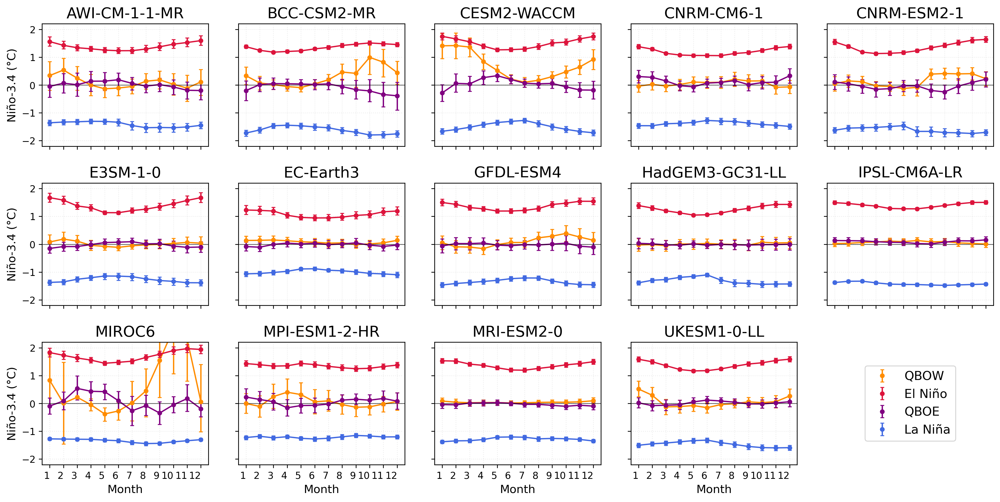

Saved: /glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/sm_nino34_during_events.pdf


In [129]:
models = [m for m in model_order if m in bootstrap_results]
if not models:
    raise RuntimeError(f"No models found in {NPZ_DIR}")

# ---- layout like your barplot style ----
n_models = len(models)
ncols = 5
nrows = int(np.ceil(n_models / ncols))

plt.rcParams.update({
    "font.size": 12,
    "axes.titlesize": 16,
    "axes.labelsize": 12,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 13
})

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(3.6*ncols, 2.6*nrows),   
    sharex=True, sharey=True,
    dpi=250
)
axes = np.atleast_1d(axes).ravel()
months = np.arange(1, 13)

# consistent colors
COL = {
    "QBOW":   "darkorange",
    "ElNino": "crimson",
    "QBOE":   "purple",
    "LaNina": "royalblue",
}

def errorbar_line(ax, x, mean, err_lo, err_hi, color, label=None,
                  lw=1.4, ms=4, capsize=2):
    ax.errorbar(
        x, mean,
        yerr=[err_lo, err_hi],
        fmt='o',
        markersize=ms,
        linewidth=lw,
        elinewidth=lw,
        capsize=capsize,
        color=color,
        label=label
    )
    ax.plot(x, mean, color=color, linewidth=lw)

for i, (ax, model) in enumerate(zip(axes, models)):
    row = i // ncols
    col = i % ncols
    res = bootstrap_results[model]
    x = res["center_months"]

    errorbar_line(ax, x,
              res["mean_qbow"],
              res["err_qbow_lower"],
              res["err_qbow_upper"],
              COL["QBOW"],
              label="QBOW")

    errorbar_line(ax, x,
                  res["mean_elnino"],
                  res["err_elnino_lower"],
                  res["err_elnino_upper"],
                  COL["ElNino"],
                  label="El Niño")
    
    errorbar_line(ax, x,
                  res["mean_qboe"],
                  res["err_qboe_lower"],
                  res["err_qboe_upper"],
                  COL["QBOE"],
                  label="QBOE")
    
    errorbar_line(ax, x,
                  res["mean_lanina"],
                  res["err_lanina_lower"],
                  res["err_lanina_upper"],
                  COL["LaNina"],
                  label="La Niña")
    ax.set_title(model, pad=6)
    ax.set_xticks(months)
    ax.grid(alpha=0.25, linestyle=":")
    ax.axhline(0, color="k", lw=0.8, alpha=0.6)

    if YLIM is not None:
        ax.set_ylim(*YLIM)

    # label only left column / bottom row
    if col == 0:
        ax.set_ylabel("Niño-3.4 (°C)")
    if row == nrows - 1:
        ax.set_xlabel("Month")

# hide unused axes, but keep the FIRST unused one for the legend
unused_axes = axes[n_models:]

legend_ax = None
if len(unused_axes) > 0:
    legend_ax = unused_axes[0]   # first empty slot
    legend_ax.axis("off")

# hide any remaining unused axes
for ax in unused_axes[1:]:
    ax.set_visible(False)

# place legend in last (empty) slot as you wanted
legend_ax = axes[-1]
legend_ax.axis("off")
handles, labels = axes[0].get_legend_handles_labels()
legend_ax.legend(handles, labels, loc="center", frameon=True)

fig.subplots_adjust(bottom=0.12, top=0.95, hspace=0.30, wspace=0.18)

for i, ax in enumerate(axes[:n_models]):
    row = i // ncols
    if row == nrows - 1:
        # bottom row: rotate and slightly reduce fontsize
        plt.setp(ax.get_xticklabels(), ha="right")
    else:
        # not bottom: hide xtick labels to keep panels clean
        plt.setp(ax.get_xticklabels(), visible=False)

# save/show
fig.savefig(OUTFIG, format="pdf", bbox_inches="tight")
plt.show()
print(f"Saved: {OUTFIG}")


# Supplementary Figure 7: QBO index for each model (stacked)

In [130]:
with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/qbo_bp_results.pkl", "rb") as f:
    qbo_bp_results = pickle.load(f)

In [131]:
from matplotlib.ticker import MultipleLocator, FormatStrFormatter

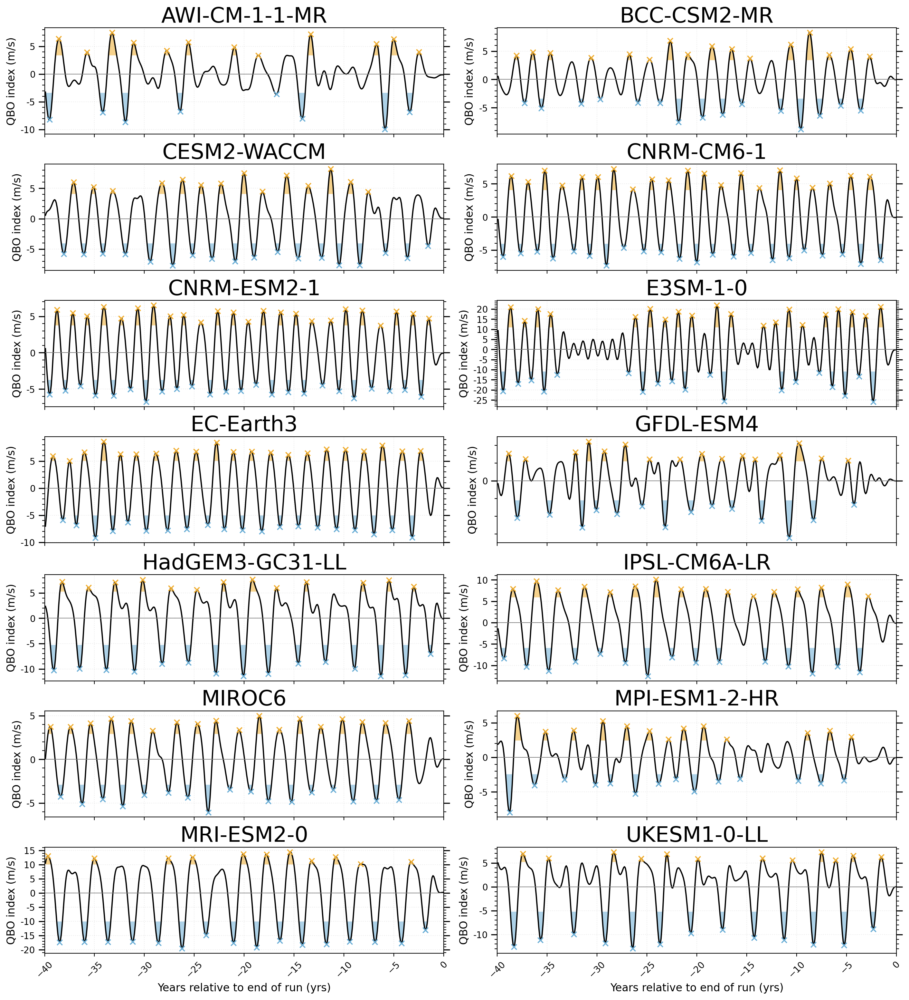

In [132]:
N_YEARS = 40
N_MONTHS = N_YEARS * 12
POS_COLOR = "#f0ad2e"   # orange-ish for >0
NEG_COLOR = "#6aaed6"   # blue-ish for <0

def detrend_1d(y):
    """Remove linear trend (ignores NaNs)."""
    y = np.asarray(y, dtype=float)
    x = np.arange(len(y), dtype=float)
    m = np.isfinite(y)
    if m.sum() < 2:
        return y
    p = np.polyfit(x[m], y[m], 1)
    return y - np.polyval(p, x)

names = list(qbo_bp_results.keys())
n = len(names)

nrows = 7
ncols = 2

fig, axes = plt.subplots(
    nrows, ncols,
    sharex=True,
    figsize=(14, 2.2*nrows),
    constrained_layout=True,
    dpi=200
)

plt.rcParams.update({
    "font.size": 18,
    "axes.titlesize": 24,
    "axes.labelsize": 22,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
    "legend.fontsize": 20
})

axes = axes.ravel()

for ax, name in zip(axes, names):
    y = qbo_bp_results[name]

    # last 40 years (480 months)
    y_last = y[-N_MONTHS:] if len(y) >= N_MONTHS else y[:]
    y_last = detrend_1d(np.asarray(y_last))

    nmo = len(y_last)
    x_years = (np.arange(nmo) - (nmo - 1)) / 12.0

    ax.plot(x_years, y_last, linewidth=1.4, color='k')
    height = np.std(y_last)
    east_peaks, _ = find_peaks(-y_last, distance=15, height=height)
    west_peaks, _ = find_peaks(y_last, distance=15, height=height)
    
    # plot peak markers
    ax.scatter(x_years[east_peaks], y_last[east_peaks], marker="x", s=35, color=NEG_COLOR, linewidth=1.3, zorder=5, label="QBOE peaks")
    
    ax.scatter(x_years[west_peaks], y_last[west_peaks], marker="x", s=35, color=POS_COLOR, linewidth=1.3, zorder=5, label="QBOW peaks")

    ax.fill_between(x_years, height, y_last, where=(y_last >= height),
                    interpolate=True, facecolor=POS_COLOR, alpha=0.55, linewidth=0)

    ax.fill_between(x_years, -height, y_last, where=(y_last < -height),
                    interpolate=True, facecolor=NEG_COLOR, alpha=0.55, linewidth=0)
    ax.label_outer()
    ax.axhline(0, linewidth=0.7, c='grey')
    
    ax.yaxis.set_major_locator(MultipleLocator(5))
    ax.yaxis.set_minor_locator(MultipleLocator(1))
    
    ax.yaxis.set_major_formatter(FormatStrFormatter('%d'))
    
    # ticks + labels on both sides
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(axis='y', which='both',
                   labelleft=True, labelright=False)
    
    # tick appearance
    ax.tick_params(axis='y', which='major', length=7, width=1.2, labelsize=10)
    ax.tick_params(axis='y', which='minor', length=3, width=0.8, labelsize=10)
    ax.set_title(name)
    ax.set_ylabel("QBO index (m/s)", fontsize=12)
    
    ax.grid(alpha=0.25, linestyle=":")

# Hide any unused panels (if n < 14)
for ax in axes[n:]:
    ax.set_visible(False)

# Bottom row x-axis formatting
for ax in axes[-ncols:]:
    ax.set_xlabel("Years relative to end of run (yrs)")
    ax.set_xlim(-N_YEARS, 0)
    ax.set_xticks(np.arange(-40, 1, 5))
    ax.tick_params(axis="x", labelrotation=45)

# Tick font size
for ax in axes:
    ax.tick_params(axis="both", which="major")

plt.savefig("/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/sm_qbo_index_models.pdf",
            format="pdf", bbox_inches="tight")

plt.show()

# Supplementary Figure 8: Nino3.4 index for each model (stacked)

In [133]:
with open("/glade/u/home/kkoepnick/qbo-enso/saved_data/nino34_cmip.pkl", "rb") as f:
    nino34_data = pickle.load(f)

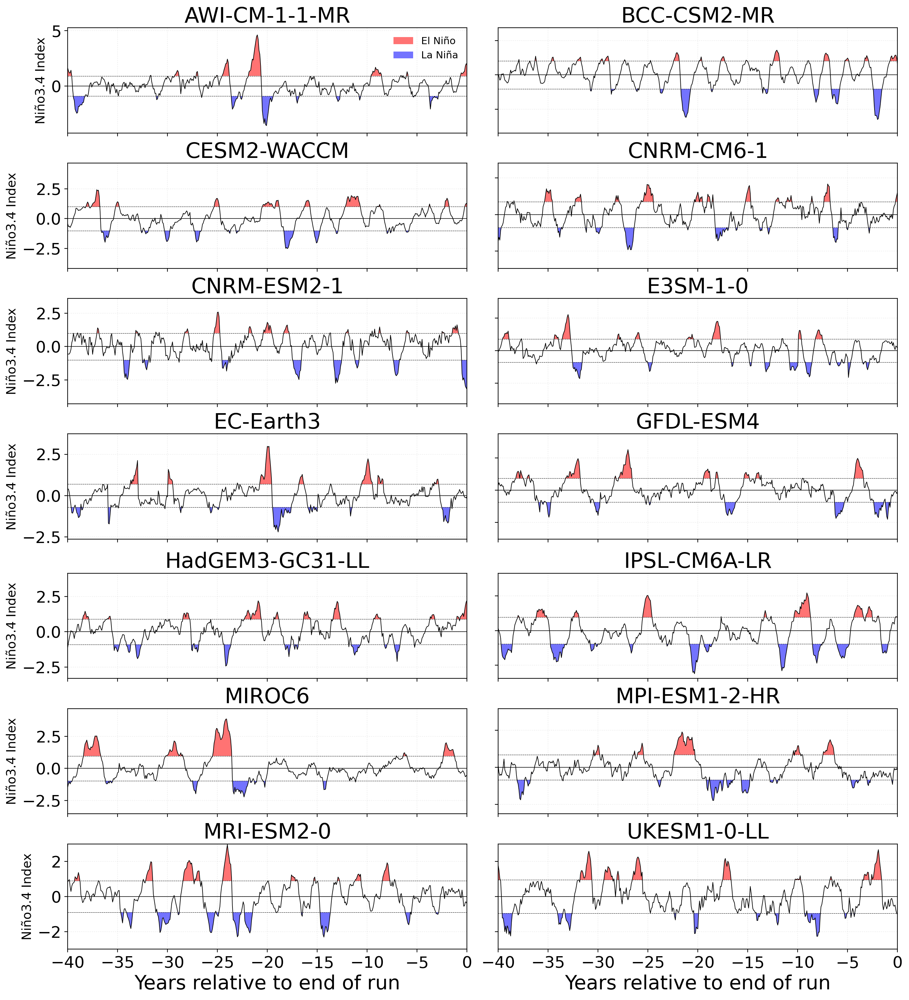

In [134]:
ELNINO_COLOR = "r"
LANINA_COLOR = "b"
N_YEARS  = 40
N_MONTHS = N_YEARS * 12

def plot_nino34_stack(nino34_data, n_years=40,
                      elnino_color="r", lanina_color="b",
                      outfile=None):

    names = list(nino34_data.keys())
    n = len(names)

    nrows = 7
    ncols = 2

    fig, axes = plt.subplots(
        nrows, ncols,
        sharex=True,
        figsize=(14, 2.2*nrows),
        constrained_layout=True,
        dpi=200
    )
    plt.rcParams.update({
    "font.size": 18,
    "axes.titlesize": 24,
    "axes.labelsize": 22,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
    "legend.fontsize": 20
    })
    axes = axes.ravel()

    for ax, name in zip(axes, names):

        y = nino34_data[name]["y"]
        sigma = nino34_data[name]["sigma"]
        x = nino34_data[name]["x"]

        # El Niño shading
        ax.fill_between(
            x, sigma, y,
            where=(y >= sigma),
            facecolor=elnino_color,
            alpha=0.55,
            interpolate=True,
            linewidth=0,
            label="El Niño" if ax is axes[0] else None
        )

        # La Niña shading
        ax.fill_between(
            x, -sigma, y,
            where=(y <= -sigma),
            facecolor=lanina_color,
            alpha=0.55,
            interpolate=True,
            linewidth=0,
            label="La Niña" if ax is axes[0] else None
        )

        ax.plot(x, y, color="k", linewidth=0.7)
        ax.axhline(0, color="k", linewidth=0.6)
        ax.axhline(+sigma, color="k", linewidth=0.4, linestyle="--")
        ax.axhline(-sigma, color="k", linewidth=0.4, linestyle="--")

        ax.set_title(name)
        ax.grid(alpha=0.25, linestyle=":")

    # Hide unused panels if fewer than 14 models
    for ax in axes[n:]:
        ax.set_visible(False)

    # Bottom row x-axis formatting
    for ax in axes[-ncols:]:
        ax.set_xlabel("Years relative to end of run")
        ax.set_xlim(-n_years, 0)
        ax.set_ylim(-3,3)

        step = 5 if n_years <= 60 else 10
        ax.set_xticks(np.arange(-n_years, 1, step))

    # Only left column gets y-labels (cleaner layout)
    for i, ax in enumerate(axes):
        col = i % ncols
        if col == 0:
            ax.set_ylabel("Niño3.4 Index", fontsize=14)
        else:
            ax.set_yticklabels([])

        ax.tick_params(axis="both", which="major")

    axes[0].legend(loc="upper right", fontsize=11, frameon=False)

    if outfile is not None:
        plt.savefig(outfile, bbox_inches="tight", format="pdf")

    plt.show()

plot_nino34_stack(
    nino34_data,
    n_years=N_YEARS,
    elnino_color=ELNINO_COLOR,
    lanina_color=LANINA_COLOR,
    outfile="/glade/u/home/kkoepnick/qbo-enso/seasonality-cmip/revision-1/figures/sm_nino34_models.pdf"
)